The dataset contains grades scored by students throughout their university tenure in various courses and their CGPA calculated based on their grades
Columns Description-  total 43 columns
-Seat No : The enrolled number of candidate that took the exams

CGPA : The cumulative GPA based on the four year total grade progress of each candidate . CGPA is a Final Marks -- provided to student.
 
· All other columns are course codes in the format AB-XXX where AB are alphabets representing candidates' departments and XXX are numbers where first X represents the year the canditate took exam

 
Predict - CGPA of a student based on different grades in four years.



In [ ]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt

In [50]:
df = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset4/main/Grades.csv")
df

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,CS-97001,B-,D+,C-,C,C-,D+,D,C-,B-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,CS-97002,A,D,D+,D,B-,C,D,A,D+,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,CS-97003,A,B,A,B-,B+,A,B-,B+,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,CS-97004,D,C+,D+,D,D,A-,D+,C-,D,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,CS-97005,A-,A-,A-,B+,A,A,A-,B+,A,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,CS-97567,B,A,A,A-,A+,A,A-,A-,A+,...,A-,A-,A,A,A,B+,B+,B,A,3.798
567,CS-97568,A+,A,A,A,A,A,A,A-,A,...,B+,B+,A,A,A-,B,A-,C,A-,3.772
568,CS-97569,B,A,A-,B+,A,A,A,A,A,...,A-,B,A,B+,A,C,B+,A-,A-,3.470
569,CS-97570,A,B+,D,A,D,D+,B-,C-,B-,...,D,B,B,C-,D,C,B,B-,C,2.193


In [51]:
df.shape

(571, 43)

In [52]:
print("No.of rows in the dataset",df.shape[0])
print("No.of columns in the dataset",df.shape[1])

No.of rows in the dataset 571
No.of columns in the dataset 43


In [53]:
df.dtypes

Seat No.      object
PH-121        object
HS-101        object
CY-105        object
HS-105/12     object
MT-111        object
CS-105        object
CS-106        object
EL-102        object
EE-119        object
ME-107        object
CS-107        object
HS-205/20     object
MT-222        object
EE-222        object
MT-224        object
CS-210        object
CS-211        object
CS-203        object
CS-214        object
EE-217        object
CS-212        object
CS-215        object
MT-331        object
EF-303        object
HS-304        object
CS-301        object
CS-302        object
TC-383        object
MT-442        object
EL-332        object
CS-318        object
CS-306        object
CS-312        object
CS-317        object
CS-403        object
CS-421        object
CS-406        object
CS-414        object
CS-419        object
CS-423        object
CS-412        object
CGPA         float64
dtype: object

This dataset contains two types of data: object and float64

In [54]:
df.isnull().sum()

Seat No.      0
PH-121        0
HS-101        0
CY-105        1
HS-105/12     1
MT-111        2
CS-105        0
CS-106        2
EL-102        2
EE-119        2
ME-107        2
CS-107        2
HS-205/20     5
MT-222        5
EE-222        7
MT-224        7
CS-210        7
CS-211        5
CS-203        5
CS-214        6
EE-217        6
CS-212        6
CS-215        6
MT-331        9
EF-303       10
HS-304       10
CS-301       10
CS-302       10
TC-383       10
MT-442       10
EL-332        9
CS-318        9
CS-306        9
CS-312       10
CS-317       12
CS-403       12
CS-421       12
CS-406       85
CS-414       13
CS-419       13
CS-423       14
CS-412       79
CGPA          0
dtype: int64

As we can see there are lot of columns with null values so we fill these null values

In [55]:
df['CS-406'].value_counts()

A-    177
A      79
B+     64
B      58
B-     22
C+     22
C      19
D+     14
C-      8
A+      8
F       6
D       5
W       3
WU      1
Name: CS-406, dtype: int64

In [56]:
df['CS-406']=df['CS-406'].fillna('A-')

In [57]:
df['CS-301'].value_counts()

A-    108
B+     74
B      71
A      66
B-     60
C      41
C+     37
C-     36
D      29
D+     29
A+      9
F       1
Name: CS-301, dtype: int64

In [58]:
df['CS-301']=df['CS-301'].fillna('A-')

In [59]:
df['HS-304'].value_counts()

A-    128
B      72
B-     70
B+     66
C      58
C+     53
C-     33
A      28
D      20
D+     19
F       6
A+      4
WU      2
W       2
Name: HS-304, dtype: int64

In [60]:
df['HS-304']=df['HS-304'].fillna('A-')

In [61]:
df['EF-303'].value_counts()

B     112
B-     92
C      61
B+     59
C+     58
C-     56
D+     49
A-     38
D      19
A      14
F       2
WU      1
Name: EF-303, dtype: int64

In [62]:
df['EF-303']=df['EF-303'].fillna('B')

In [63]:
df['CS-302'].value_counts()

A-    113
B     102
A      86
B+     81
B-     60
C+     32
C      28
D      21
C-     19
D+     10
A+      9
Name: CS-302, dtype: int64

In [64]:
df['CS-302']=df['CS-302'].fillna('A-')

In [65]:
df['TC-383'].value_counts()

A     105
A-     73
B+     68
B      59
C+     44
D+     44
C-     42
C      42
B-     40
A+     23
D      20
F       1
Name: TC-383, dtype: int64

In [66]:
df['TC-383']=df['TC-383'].fillna('A')

In [67]:
df['TC-383'].mode()

0    A
Name: TC-383, dtype: object

In [68]:
df['MT-442'].value_counts()

A-    140
A     130
B+     65
B      47
A+     39
B-     30
C-     28
C+     24
C      24
D      20
D+     13
F       1
Name: MT-442, dtype: int64

In [69]:
df['MT-442'].mode()

0    A-
Name: MT-442, dtype: object

In [70]:
df['MT-442']=df['MT-442'].fillna('A-')

In [71]:
df['EL-332'].value_counts()

A-    96
A     76
B+    68
B     67
B-    62
C     49
C+    38
C-    32
D+    22
D     22
A+    20
F      9
WU     1
Name: EL-332, dtype: int64

In [72]:
df['EL-332']=df['EL-332'].fillna('A-')

In [73]:
df['CS-318'].value_counts()

A-    89
B-    69
B     68
B+    65
C     53
C+    49
A     42
C-    40
D     36
D+    29
F     10
A+     6
WU     5
W      1
Name: CS-318, dtype: int64

In [74]:
df['CS-318']=df['CS-318'].fillna('A-')

In [75]:
df['CS-306'].value_counts()

A-    120
B+     75
A      74
B-     64
B      53
C-     40
C      37
C+     36
D      31
D+     18
A+     10
F       3
WU      1
Name: CS-306, dtype: int64

In [76]:
df['CS-306']=df['CS-306'].fillna('A-')

In [77]:
df['CS-312'].value_counts()

A+    93
A     86
A-    63
D+    52
C     48
C-    44
B+    42
B     37
C+    37
B-    36
D     19
F      2
W      1
WU     1
Name: CS-312, dtype: int64

In [78]:
df['CS-312']=df['CS-312'].fillna('A+')

In [79]:
df['CS-317'].value_counts()

B-    79
B     75
C     70
A-    66
B+    58
C+    57
A     47
C-    41
D+    34
D     16
A+     9
F      7
Name: CS-317, dtype: int64

In [80]:
df['CS-317']=df['CS-317'].fillna('B-')

In [81]:
df['CS-403'].value_counts()

A     133
A-    106
B+     62
B-     55
B      54
D+     35
C      33
C+     32
C-     30
A+     15
D       4
Name: CS-403, dtype: int64

In [82]:
df['CS-403']=df['CS-403'].fillna('A')

In [83]:
df['CS-421'].value_counts()

B     86
B-    74
C     68
C+    61
C-    60
B+    60
A-    47
D+    36
A     25
D     21
F     17
A+     2
W      2
Name: CS-421, dtype: int64

In [84]:
df['CS-421']=df['CS-421'].fillna('B')

In [85]:
df['CS-414'].value_counts()

A     176
A-    156
B+     62
B      54
B-     21
A+     21
C+     21
C      20
C-     12
F       7
D+      3
D       3
W       2
Name: CS-414, dtype: int64

In [86]:
df['CS-414']=df['CS-414'].fillna('A')

In [87]:
df['CS-419'].value_counts()

A-    120
B      89
B+     85
B-     78
A      56
C+     46
C      40
C-     20
D+     13
D       7
A+      2
F       2
Name: CS-419, dtype: int64

In [88]:
df['CS-419']=df['CS-419'].fillna('A-')

In [89]:
df['CS-423'].value_counts()

A-    122
A      78
B+     75
B      65
B-     56
C      45
C+     39
C-     29
D+     25
D      15
F       5
A+      3
Name: CS-423, dtype: int64

In [90]:
df['CS-423']=df['CS-423'].fillna('A-')

In [91]:
df['CS-412'].value_counts()

A-    157
B+     80
A      77
B      65
B-     37
C+     24
C      19
D+      8
C-      7
F       6
D       5
A+      4
W       3
Name: CS-412, dtype: int64

In [92]:
df['CS-412']=df['CS-412'].fillna('A-')

In [93]:
df.dropna(inplace=True)

In [94]:
df.isnull().sum()

Seat No.     0
PH-121       0
HS-101       0
CY-105       0
HS-105/12    0
MT-111       0
CS-105       0
CS-106       0
EL-102       0
EE-119       0
ME-107       0
CS-107       0
HS-205/20    0
MT-222       0
EE-222       0
MT-224       0
CS-210       0
CS-211       0
CS-203       0
CS-214       0
EE-217       0
CS-212       0
CS-215       0
MT-331       0
EF-303       0
HS-304       0
CS-301       0
CS-302       0
TC-383       0
MT-442       0
EL-332       0
CS-318       0
CS-306       0
CS-312       0
CS-317       0
CS-403       0
CS-421       0
CS-406       0
CS-414       0
CS-419       0
CS-423       0
CS-412       0
CGPA         0
dtype: int64

We have successfully filled the null values let us check from the heatmap as well

<Axes: >

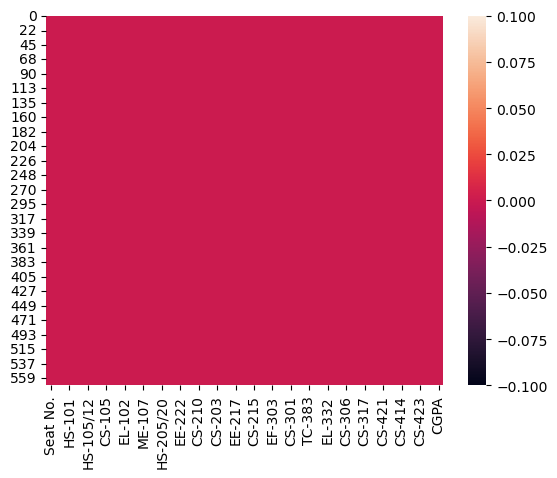

In [95]:
sns.heatmap(df.isnull())

From the above heatmap it is clear that there is now no missing data present in our Dataset

In [96]:
df.duplicated().sum()

0

In [97]:
df.shape

(561, 43)

Now the dataset consists of 561 rows and 43 columns

In [98]:
df.columns

Index(['Seat No.', 'PH-121', 'HS-101', 'CY-105', 'HS-105/12', 'MT-111',
       'CS-105', 'CS-106', 'EL-102', 'EE-119', 'ME-107', 'CS-107', 'HS-205/20',
       'MT-222', 'EE-222', 'MT-224', 'CS-210', 'CS-211', 'CS-203', 'CS-214',
       'EE-217', 'CS-212', 'CS-215', 'MT-331', 'EF-303', 'HS-304', 'CS-301',
       'CS-302', 'TC-383', 'MT-442', 'EL-332', 'CS-318', 'CS-306', 'CS-312',
       'CS-317', 'CS-403', 'CS-421', 'CS-406', 'CS-414', 'CS-419', 'CS-423',
       'CS-412', 'CGPA'],
      dtype='object')

In [99]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 561 entries, 0 to 570
Data columns (total 43 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Seat No.   561 non-null    object 
 1   PH-121     561 non-null    object 
 2   HS-101     561 non-null    object 
 3   CY-105     561 non-null    object 
 4   HS-105/12  561 non-null    object 
 5   MT-111     561 non-null    object 
 6   CS-105     561 non-null    object 
 7   CS-106     561 non-null    object 
 8   EL-102     561 non-null    object 
 9   EE-119     561 non-null    object 
 10  ME-107     561 non-null    object 
 11  CS-107     561 non-null    object 
 12  HS-205/20  561 non-null    object 
 13  MT-222     561 non-null    object 
 14  EE-222     561 non-null    object 
 15  MT-224     561 non-null    object 
 16  CS-210     561 non-null    object 
 17  CS-211     561 non-null    object 
 18  CS-203     561 non-null    object 
 19  CS-214     561 non-null    object 
 20  EE-217    

In [100]:
df.dtypes

Seat No.      object
PH-121        object
HS-101        object
CY-105        object
HS-105/12     object
MT-111        object
CS-105        object
CS-106        object
EL-102        object
EE-119        object
ME-107        object
CS-107        object
HS-205/20     object
MT-222        object
EE-222        object
MT-224        object
CS-210        object
CS-211        object
CS-203        object
CS-214        object
EE-217        object
CS-212        object
CS-215        object
MT-331        object
EF-303        object
HS-304        object
CS-301        object
CS-302        object
TC-383        object
MT-442        object
EL-332        object
CS-318        object
CS-306        object
CS-312        object
CS-317        object
CS-403        object
CS-421        object
CS-406        object
CS-414        object
CS-419        object
CS-423        object
CS-412        object
CGPA         float64
dtype: object

We can see all features or input columns are in object type and our target is in float type data,also we observe that there are no requirement of Seat number column so we should remove it

In [101]:
df.drop(['Seat No.'],axis=1,inplace=True)
df.head()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,B-,D+,C-,C,C-,D+,D,C-,B-,C-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,A,D,D+,D,B-,C,D,A,D+,D,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,A,B,A,B-,B+,A,B-,B+,A-,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,D,C+,D+,D,D,A-,D+,C-,D,C+,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,A-,A-,A-,B+,A,A,A-,B+,A,A-,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448


Now we have 41 input columns and 1 target column giving it a total of 42 columns.

In [102]:
df.nunique().to_frame("No of Unique Values")

,No of Unique Values
PH-121,11
HS-101,11
CY-105,11
HS-105/12,11
MT-111,12
CS-105,11
CS-106,11
EL-102,11
EE-119,11
ME-107,11


Since the No.of Unique Values for target variable are 482 and the no of rows in the dataset are 561 which is moderate gap also the target variable is float type so i have taken this problem as Regression problem 

Univarient Analysis

PH-121


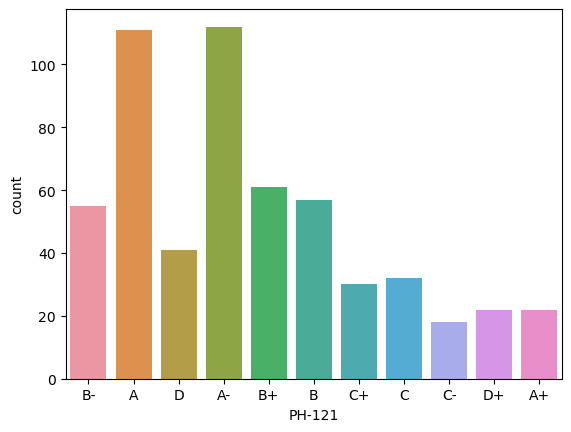

HS-101


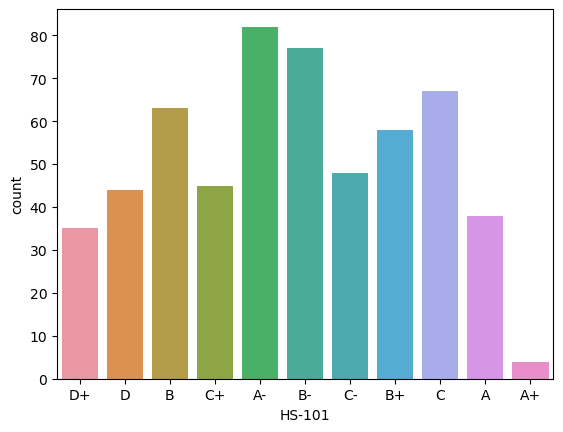

CY-105


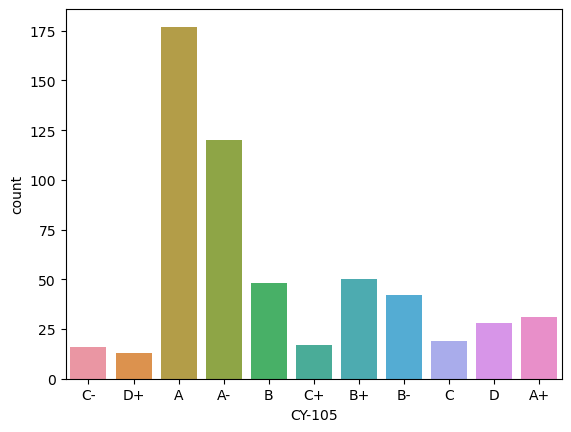

HS-105/12


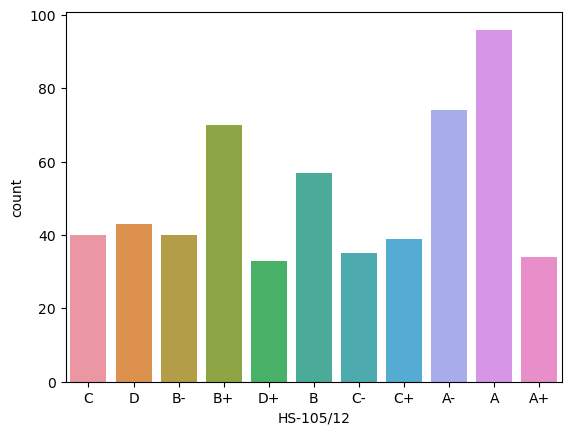

MT-111


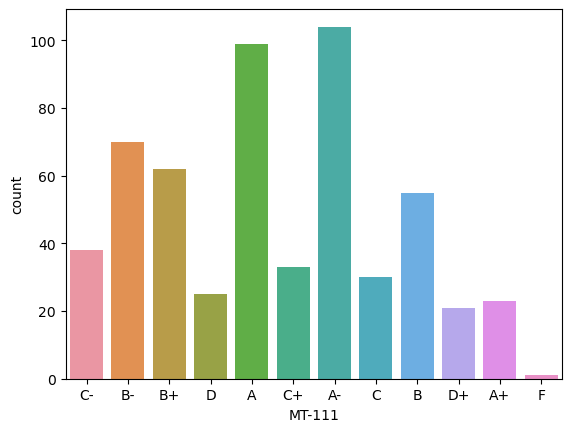

CS-105


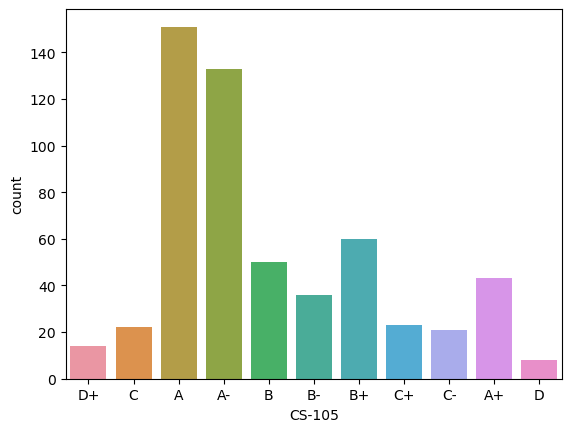

CS-106


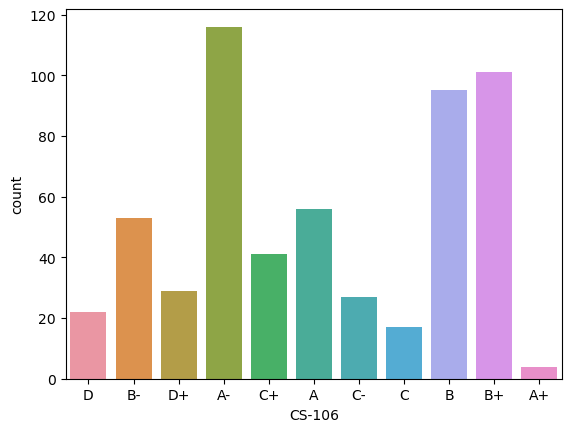

EL-102


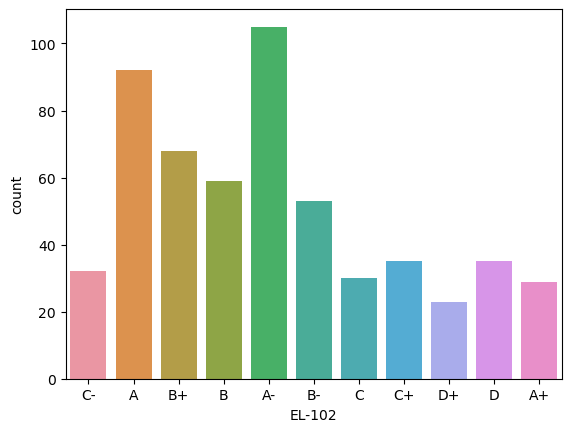

EE-119


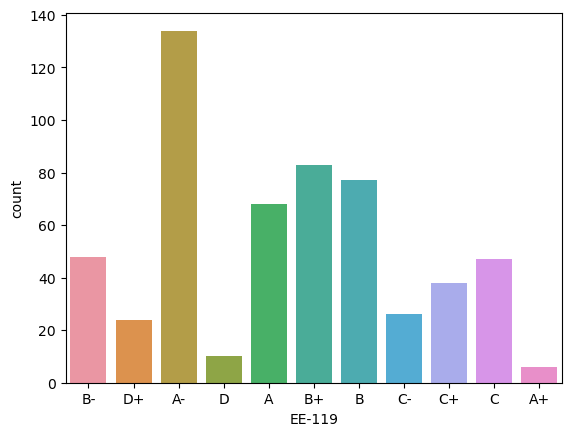

ME-107


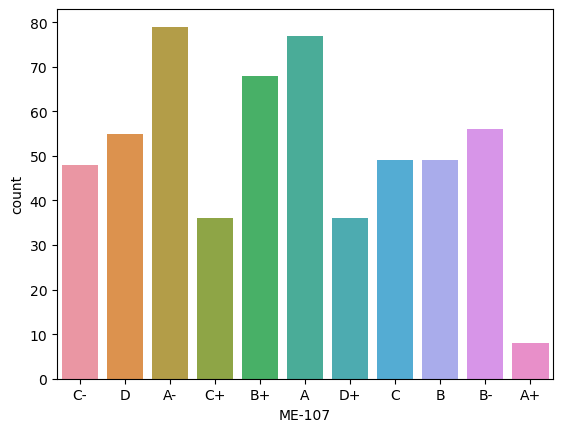

CS-107


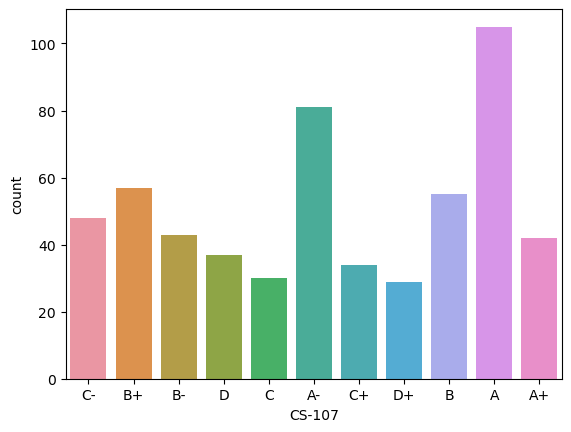

HS-205/20


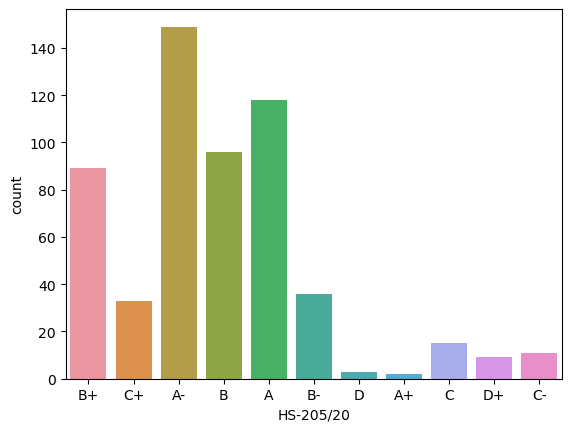

MT-222


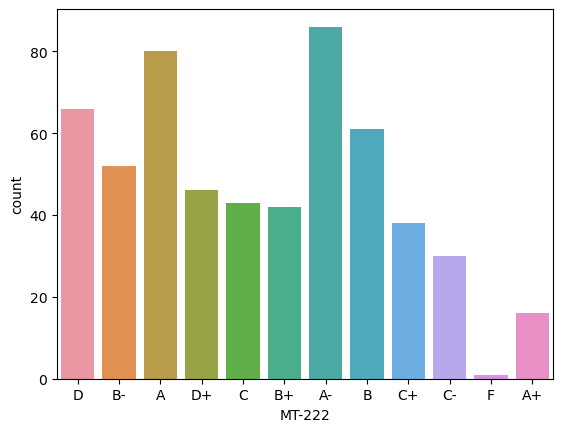

EE-222


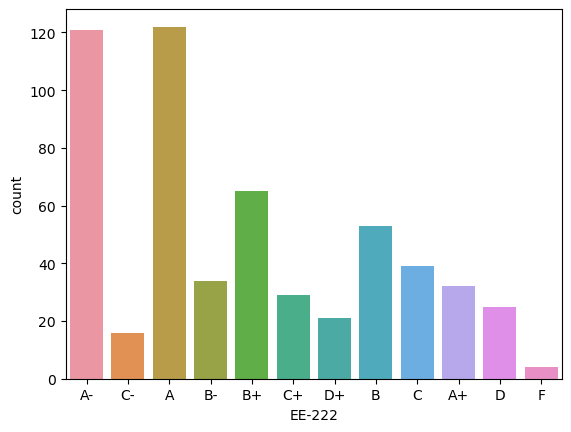

MT-224


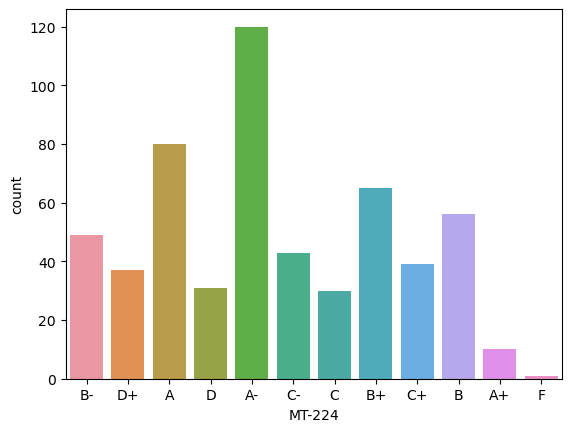

CS-210


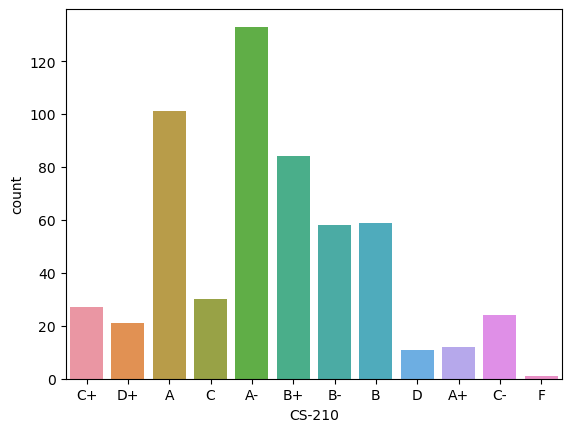

CS-211


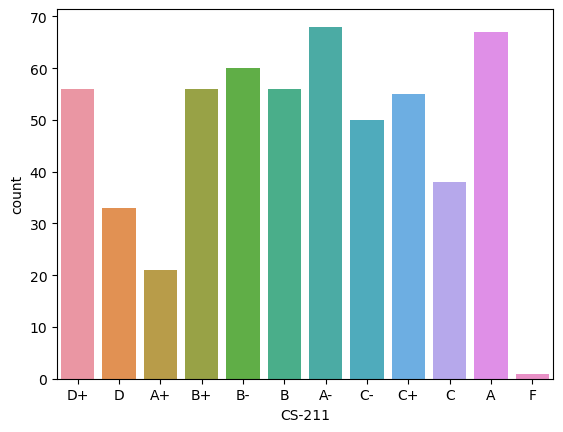

CS-203


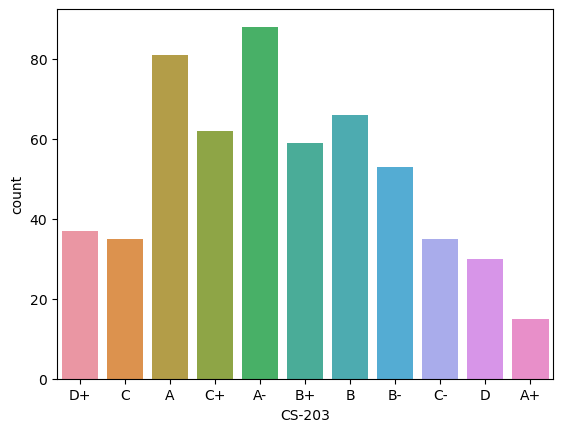

CS-214


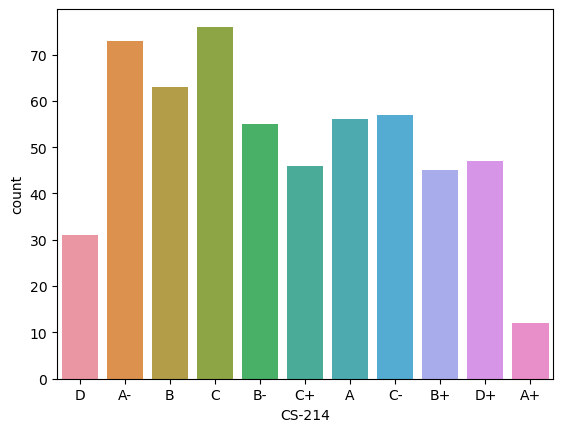

EE-217


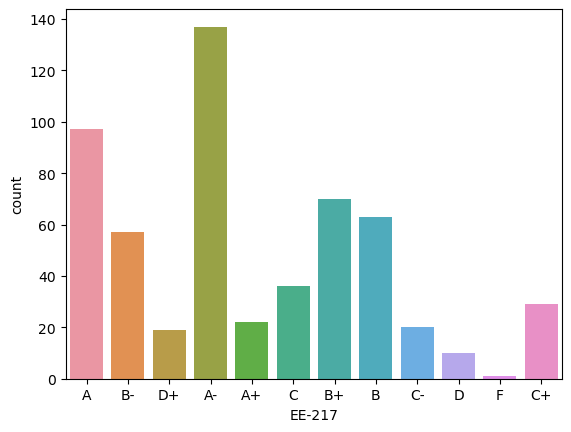

CS-212


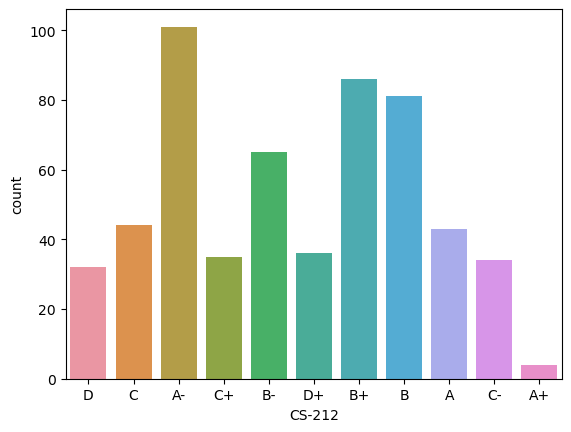

CS-215


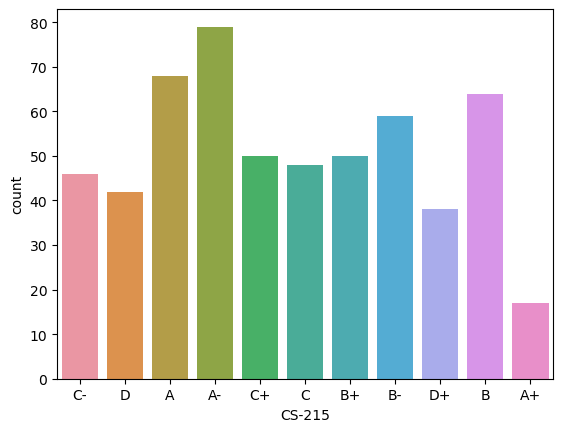

MT-331


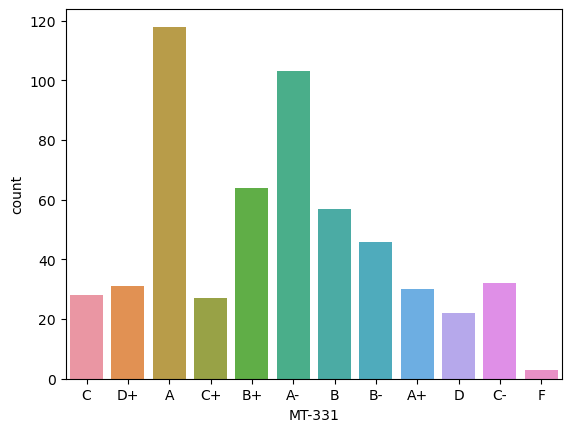

EF-303


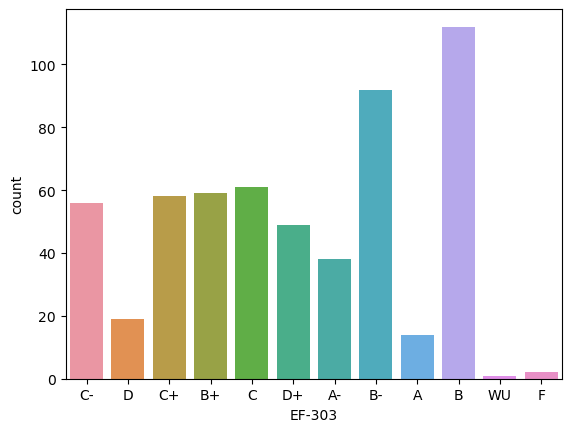

HS-304


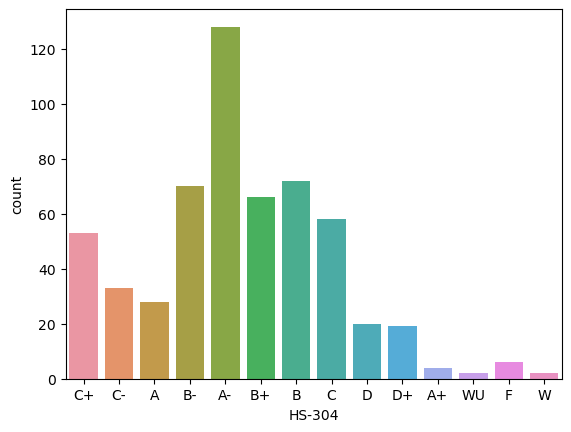

CS-301


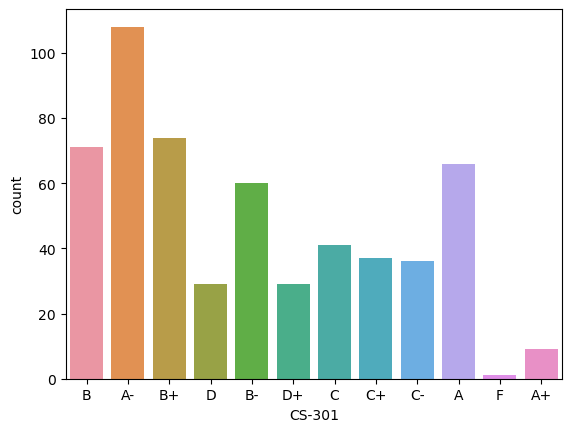

CS-302


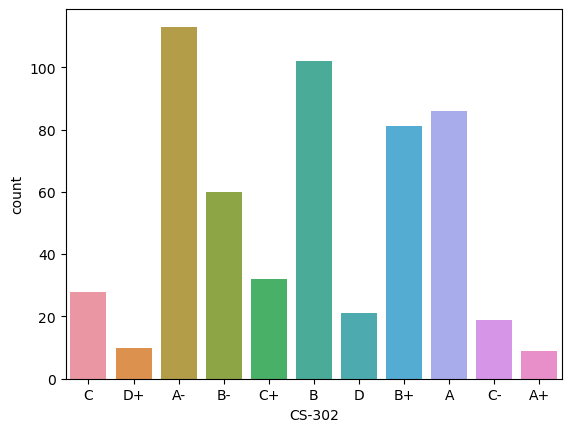

TC-383


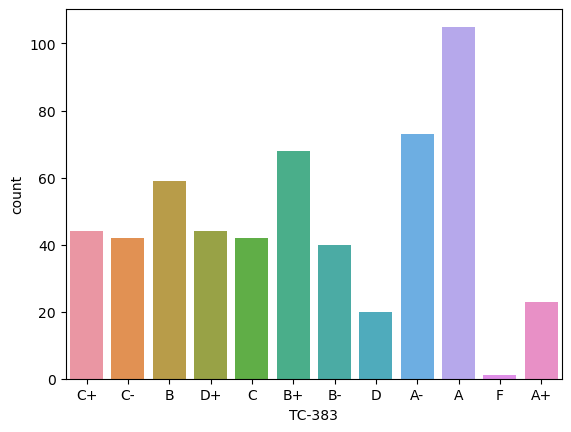

MT-442


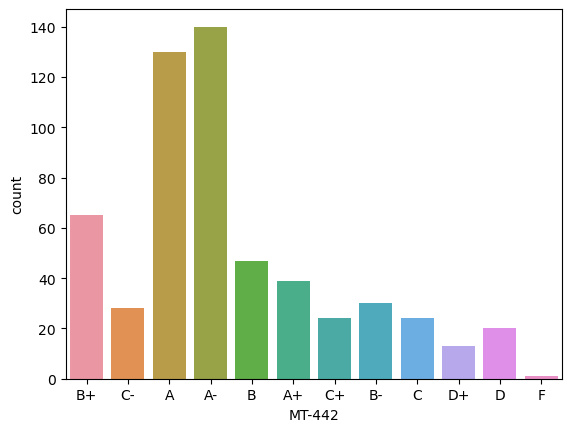

EL-332


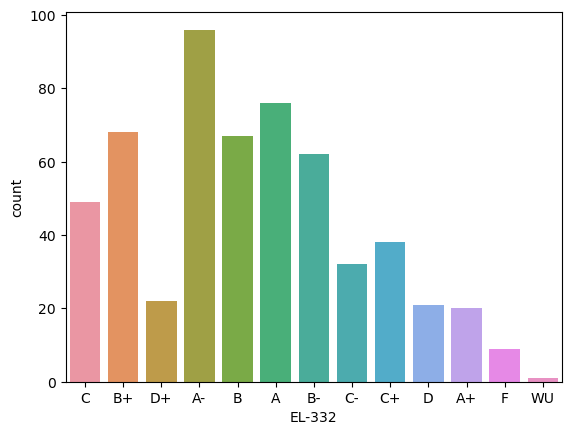

CS-318


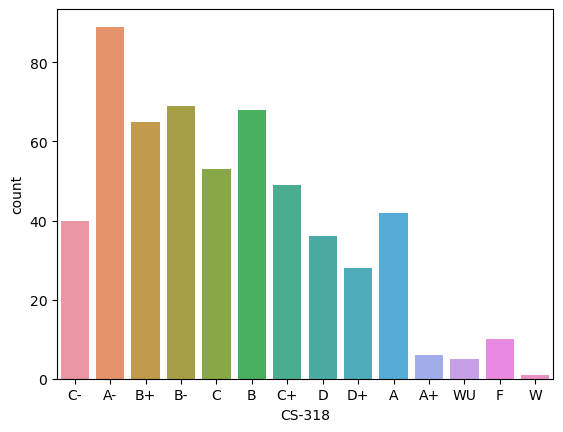

CS-306


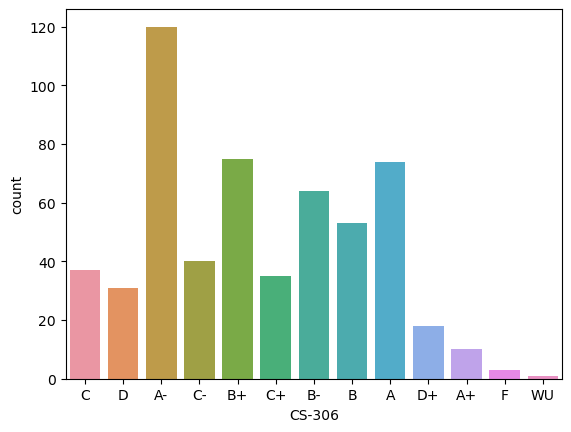

CS-312


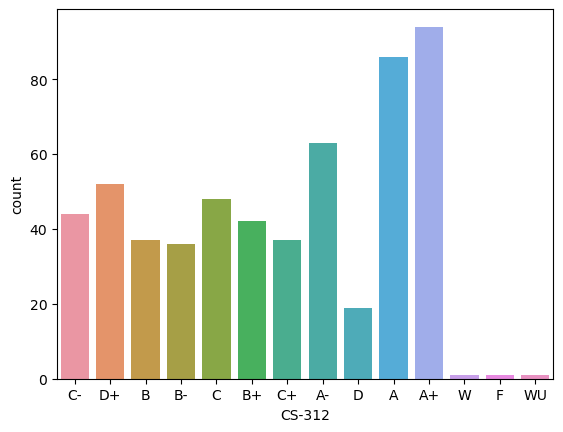

CS-317


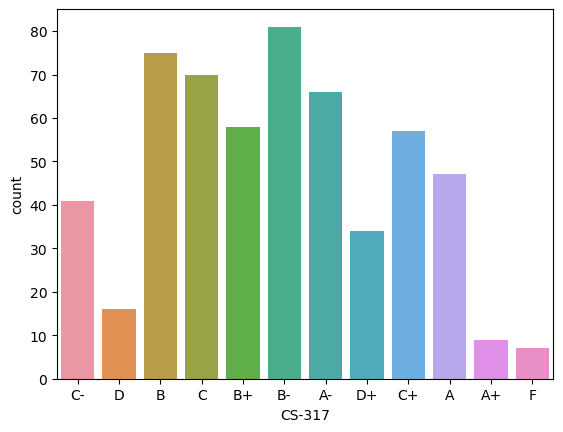

CS-403


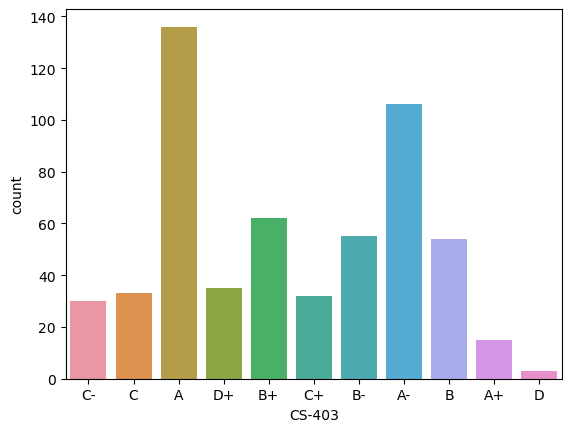

CS-421


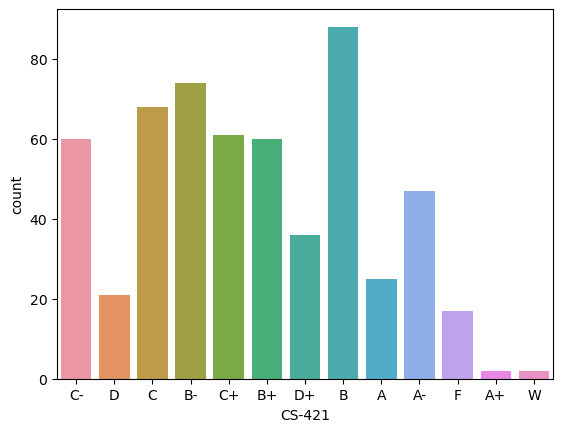

CS-406


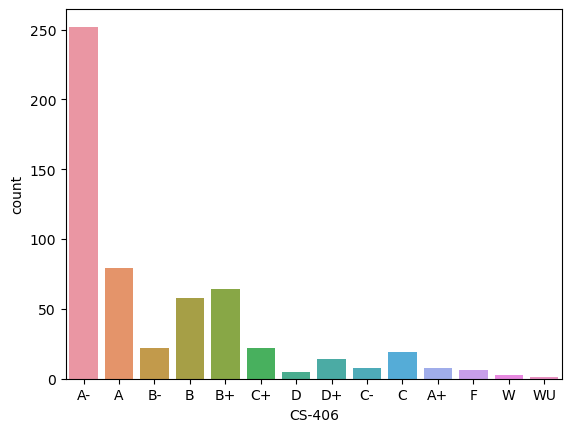

CS-414


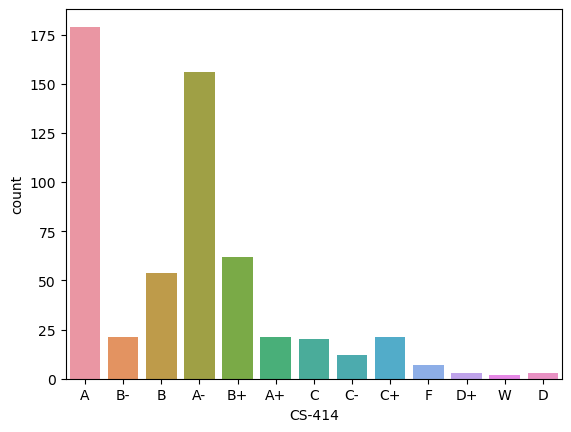

CS-419


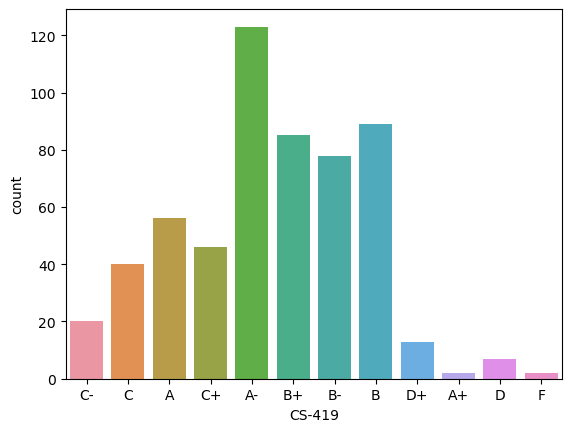

CS-423


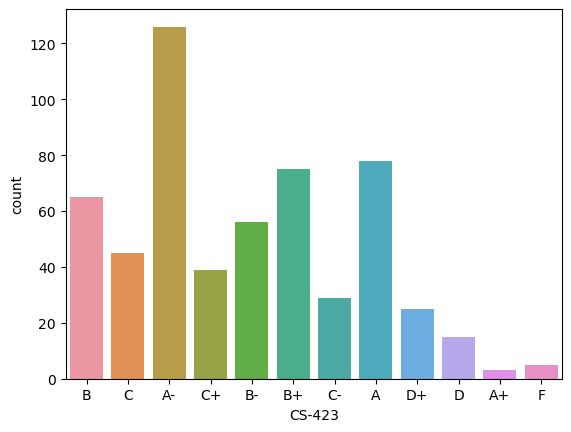

CS-412


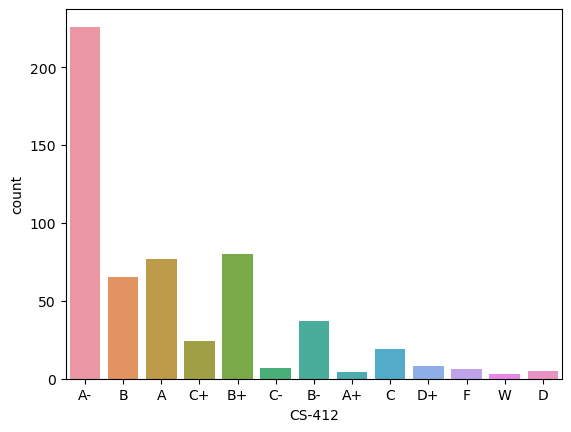

In [103]:
Count=['PH-121', 'HS-101', 'CY-105', 'HS-105/12', 'MT-111', 'CS-105', 'CS-106',
       'EL-102', 'EE-119', 'ME-107', 'CS-107', 'HS-205/20', 'MT-222', 'EE-222',
       'MT-224', 'CS-210', 'CS-211', 'CS-203', 'CS-214', 'EE-217', 'CS-212',
       'CS-215', 'MT-331', 'EF-303', 'HS-304', 'CS-301', 'CS-302', 'TC-383',
       'MT-442', 'EL-332', 'CS-318', 'CS-306', 'CS-312','CS-317','CS-403',
       'CS-421', 'CS-406', 'CS-414', 'CS-419', 'CS-423', 'CS-412']

for i in Count:
    print(str(i))
    sns.countplot(x=df[i])
    plt.show()

From the above plot we observe majority are in A-/A/B/B-,But in the CS-312 the majority of them get A+ Grade.

<Axes: xlabel='CGPA', ylabel='Count'>

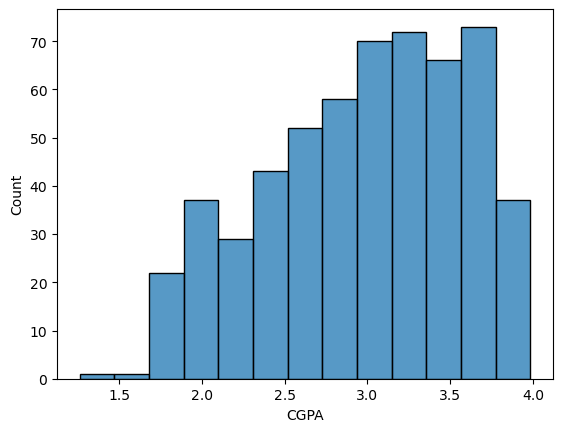

In [104]:
sns.histplot(df['CGPA'])

As we observe in above graph majority are in 3 to 3.75 CGPA

In [105]:
from sklearn.preprocessing import LabelEncoder 

In [106]:
LE=LabelEncoder()
for i in df.drop(['CGPA'],axis=1):
    df[i]=LE.fit_transform(df[i])
df

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,5,10,8,6,8,10,9,8,5,8,...,8,8,8,8,2,0,8,3,2,2.205
1,0,9,10,9,5,6,9,0,10,9,...,10,9,6,9,2,5,6,6,3,2.008
2,0,3,0,5,4,0,5,4,2,2,...,3,3,0,6,0,0,0,2,0,3.608
3,9,7,10,9,9,2,10,8,9,7,...,10,6,10,8,5,3,7,7,7,1.906
4,2,2,2,4,0,0,2,4,0,2,...,5,4,4,5,2,0,2,2,0,3.448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,3,0,0,2,1,0,2,2,1,4,...,2,2,0,0,0,4,4,3,0,3.798
567,1,0,0,0,0,0,0,2,0,0,...,4,4,0,0,2,3,2,6,2,3.772
568,3,0,2,4,0,0,0,0,0,3,...,2,3,0,4,0,6,4,2,2,3.470
569,0,4,9,0,9,10,5,8,5,8,...,9,3,3,8,9,6,3,5,6,2.193


In [107]:
df.dtypes

PH-121         int32
HS-101         int32
CY-105         int32
HS-105/12      int32
MT-111         int32
CS-105         int32
CS-106         int32
EL-102         int32
EE-119         int32
ME-107         int32
CS-107         int32
HS-205/20      int32
MT-222         int32
EE-222         int32
MT-224         int32
CS-210         int32
CS-211         int32
CS-203         int32
CS-214         int32
EE-217         int32
CS-212         int32
CS-215         int32
MT-331         int32
EF-303         int32
HS-304         int32
CS-301         int32
CS-302         int32
TC-383         int32
MT-442         int32
EL-332         int32
CS-318         int32
CS-306         int32
CS-312         int32
CS-317         int32
CS-403         int32
CS-421         int32
CS-406         int32
CS-414         int32
CS-419         int32
CS-423         int32
CS-412         int32
CGPA         float64
dtype: object

We can see that all the columns are in int32 except CGPA is in float64 and that all the columns are converted into numerical type of data.

In [108]:
df.describe()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
count,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,...,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000
mean,3.691622,5.028520,2.795009,4.176471,3.841355,2.766488,4.069519,3.884135,3.855615,4.723708,...,4.108734,4.832442,3.477718,5.427807,3.001783,2.440285,3.889483,4.001783,3.067736,2.977501
std,2.983182,2.777314,2.840846,3.148562,2.919418,2.639809,2.674045,2.960293,2.622466,3.102469,...,3.356861,2.764652,2.965869,2.734478,2.486750,2.500803,2.390886,2.807833,2.348794,0.594160
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.261000
25%,2.000000,3.000000,0.000000,2.000000,2.000000,0.000000,2.000000,2.000000,2.000000,2.000000,...,1.000000,3.000000,1.000000,3.000000,2.000000,0.000000,2.000000,2.000000,2.000000,2.564000
50%,3.000000,5.000000,2.000000,4.000000,3.000000,2.000000,4.000000,3.000000,3.000000,4.000000,...,4.000000,5.000000,3.000000,5.000000,2.000000,2.000000,4.000000,4.000000,2.000000,3.042000
75%,6.000000,7.000000,4.000000,7.000000,6.000000,4.000000,5.000000,6.000000,6.000000,7.000000,...,7.000000,7.000000,5.000000,7.000000,4.000000,4.000000,5.000000,6.000000,4.000000,3.458000
max,10.000000,10.000000,10.000000,10.000000,11.000000,10.000000,10.000000,10.000000,10.000000,10.000000,...,13.000000,11.000000,10.000000,12.000000,13.000000,12.000000,11.000000,11.000000,12.000000,3.985000


From the above we observe that:
1.Count is same for all the columns so there is no missing data in our dataset
2.we can see Mean,Median(50%),75% and minimum and maximum values for all the columns

Bivarient Analysis

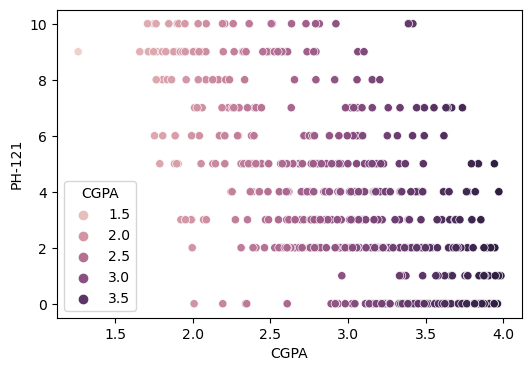

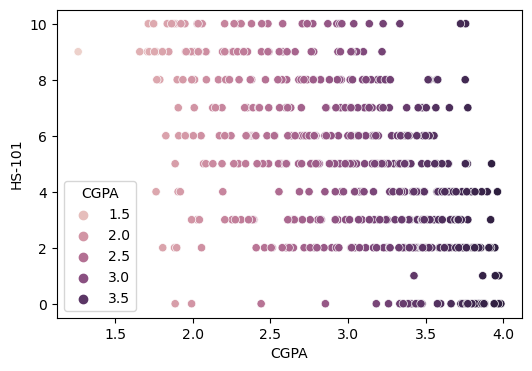

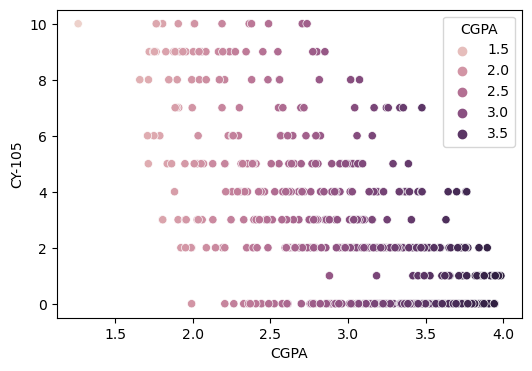

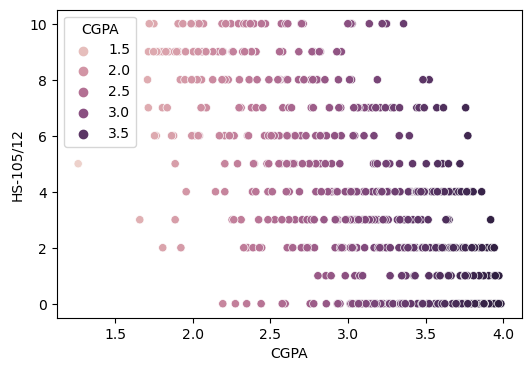

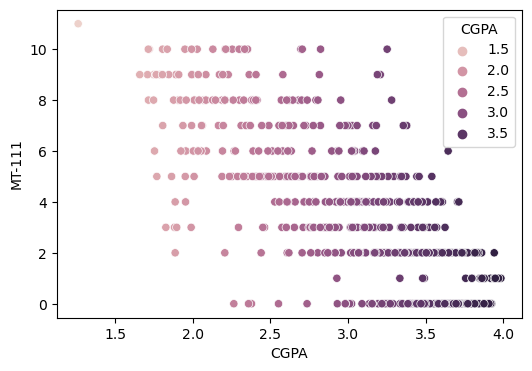

...

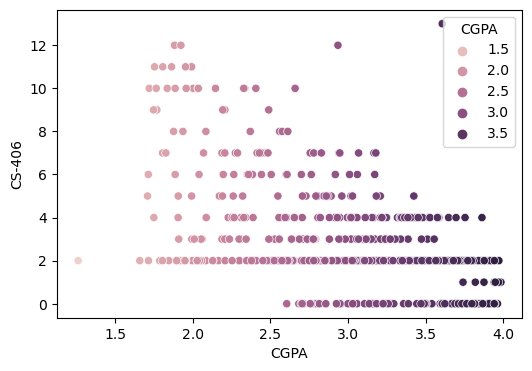

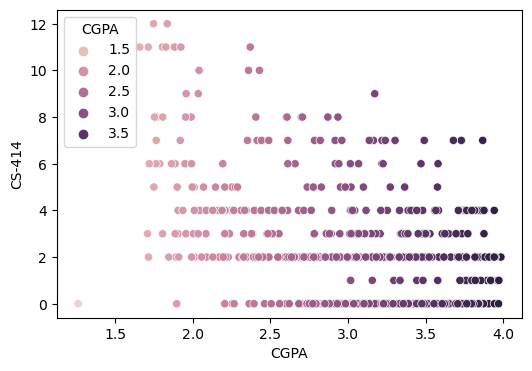

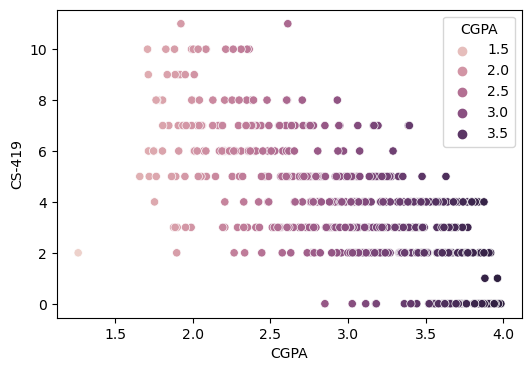

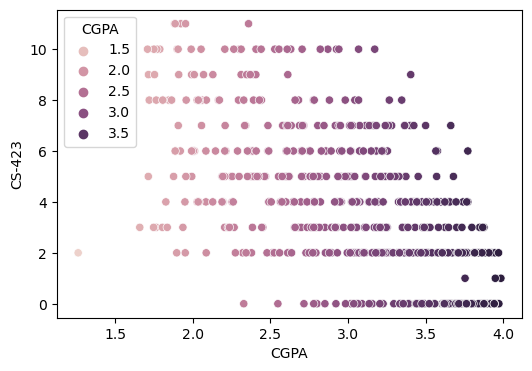

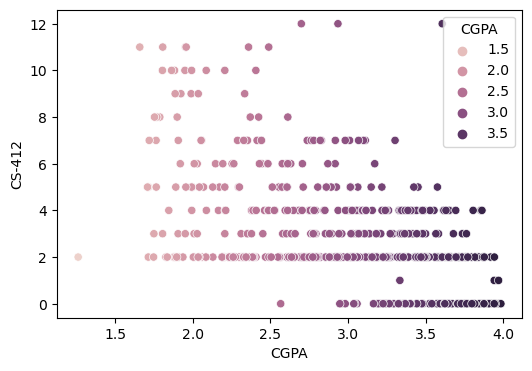

In [109]:
for col in df.drop(['CGPA'],axis=1):
    plt.figure(figsize=(6,4))
    sns.scatterplot(x=df['CGPA'],y=df[col],hue=df['CGPA'])
    plt.show()

We observe from the above plots that majority are getting high CGPA with getting high grade.

<Figure size 600x400 with 0 Axes>

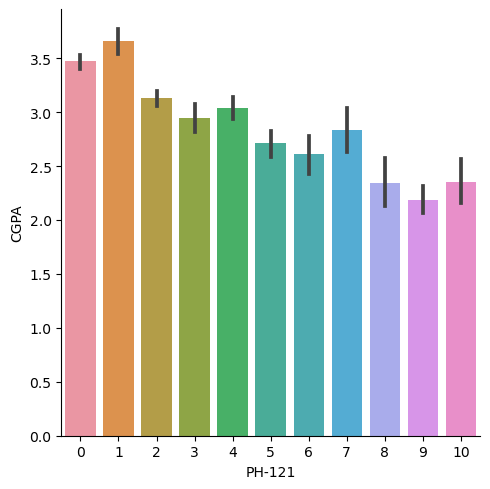

<Figure size 600x400 with 0 Axes>

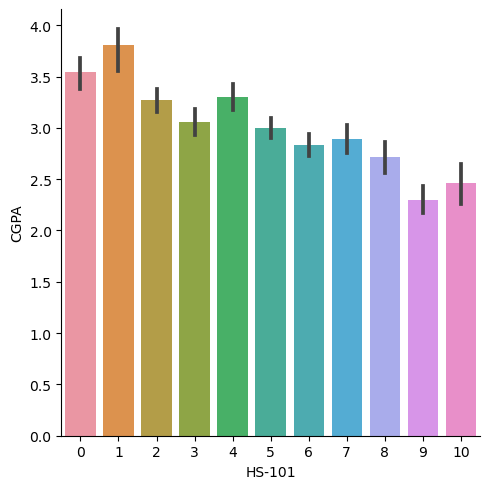

<Figure size 600x400 with 0 Axes>

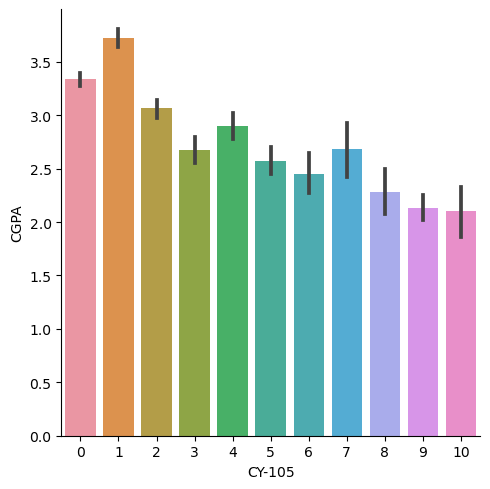

<Figure size 600x400 with 0 Axes>

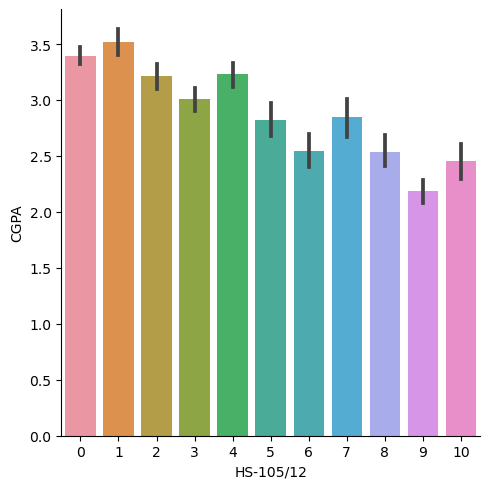

<Figure size 600x400 with 0 Axes>

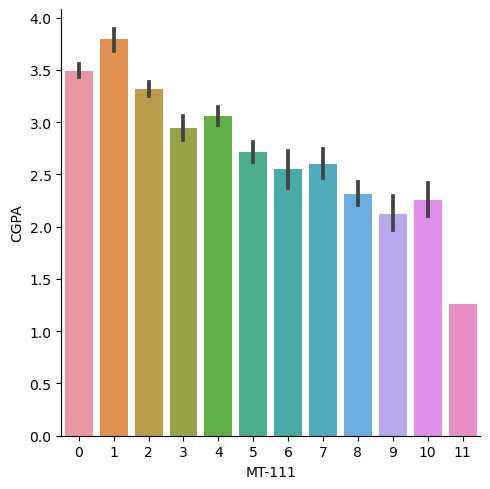

<Figure size 600x400 with 0 Axes>

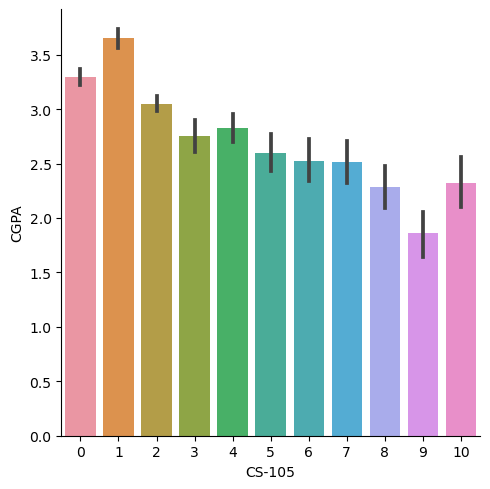

<Figure size 600x400 with 0 Axes>

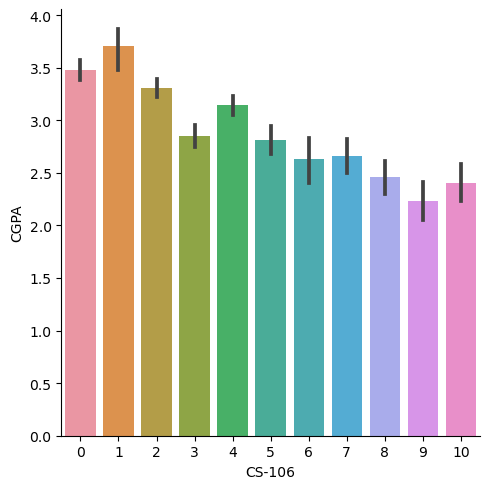

<Figure size 600x400 with 0 Axes>

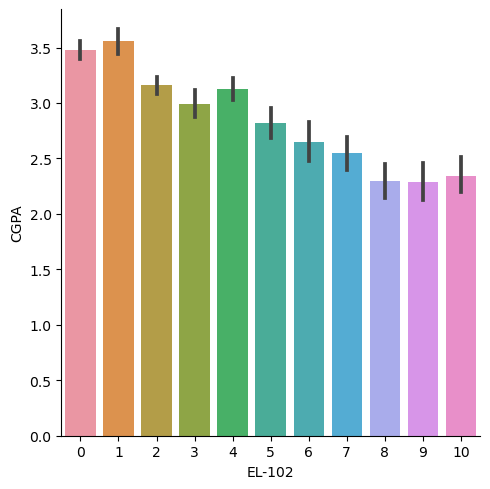

<Figure size 600x400 with 0 Axes>

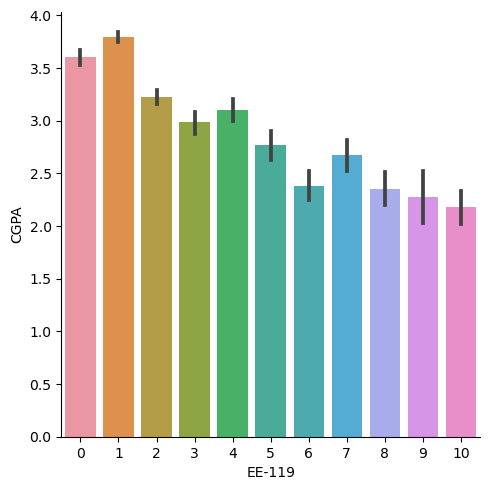

<Figure size 600x400 with 0 Axes>

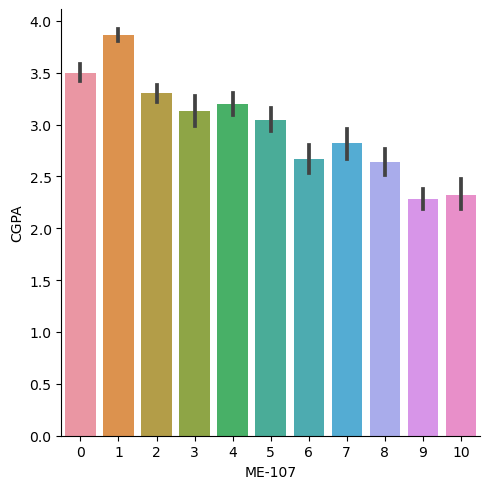

<Figure size 600x400 with 0 Axes>

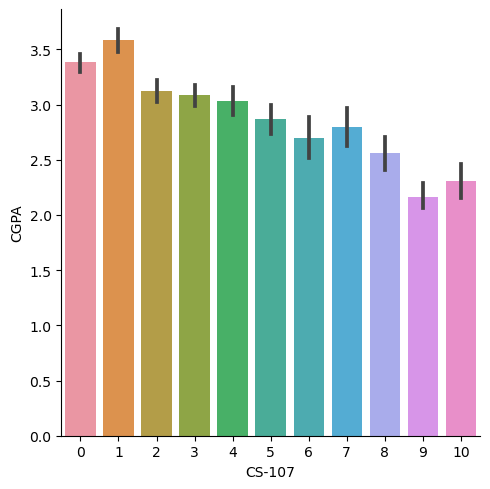

<Figure size 600x400 with 0 Axes>

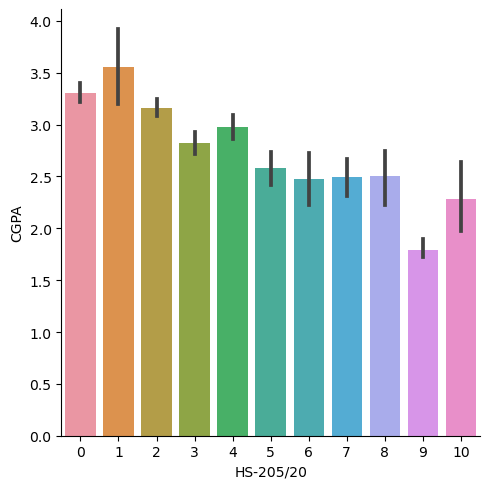

<Figure size 600x400 with 0 Axes>

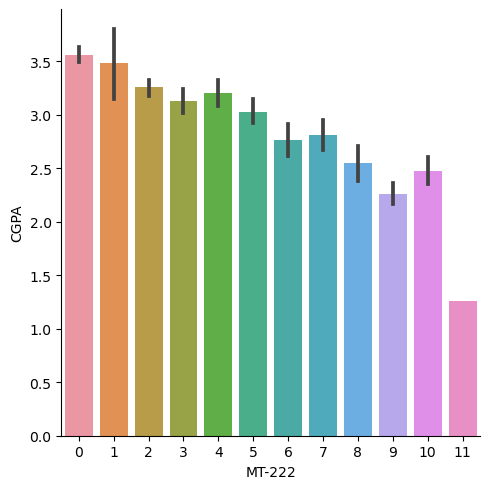

<Figure size 600x400 with 0 Axes>

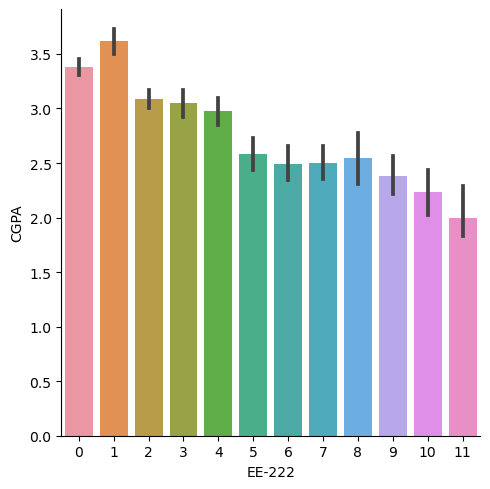

<Figure size 600x400 with 0 Axes>

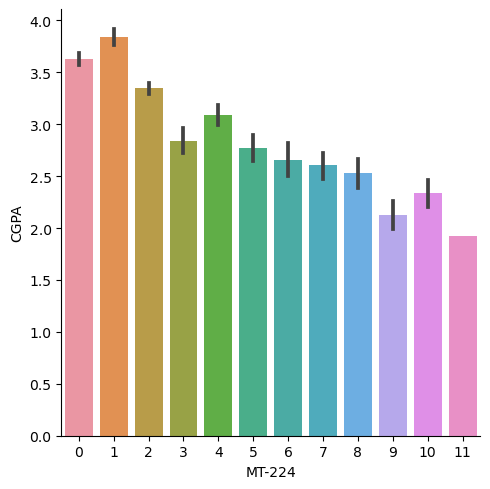

<Figure size 600x400 with 0 Axes>

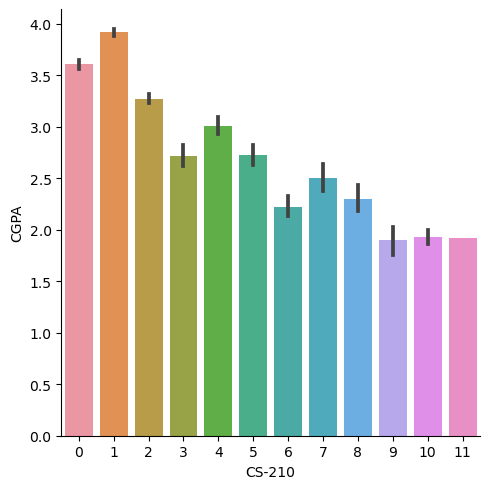

<Figure size 600x400 with 0 Axes>

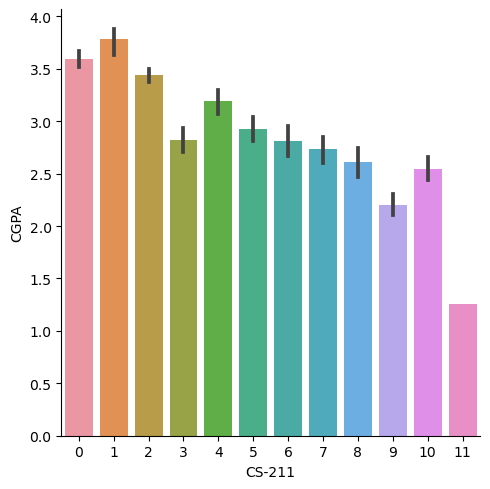

<Figure size 600x400 with 0 Axes>

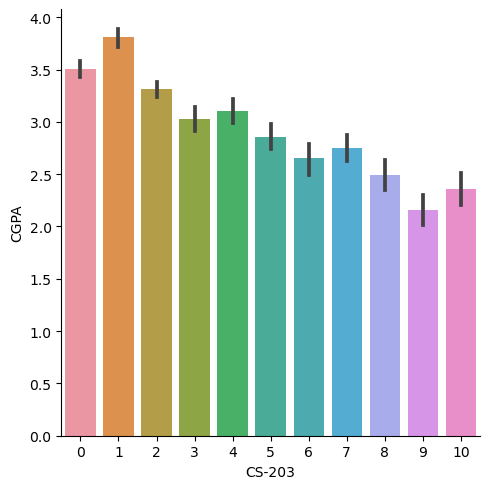

<Figure size 600x400 with 0 Axes>

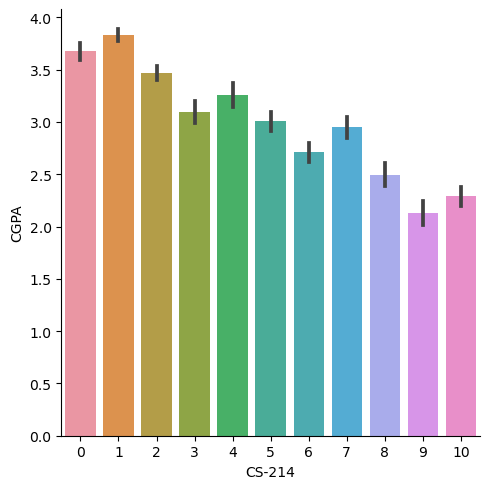

<Figure size 600x400 with 0 Axes>

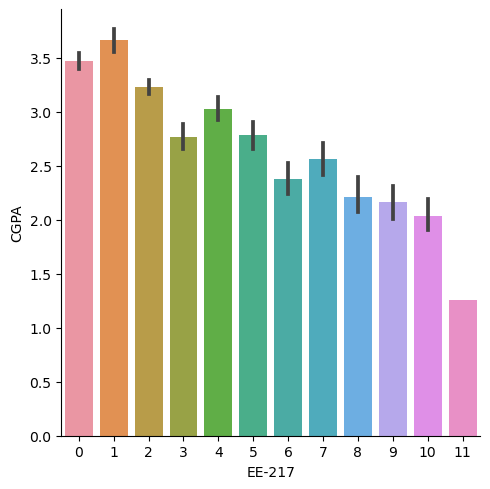

<Figure size 600x400 with 0 Axes>

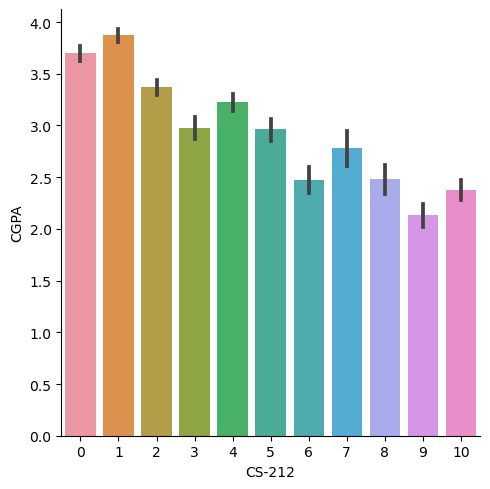

<Figure size 600x400 with 0 Axes>

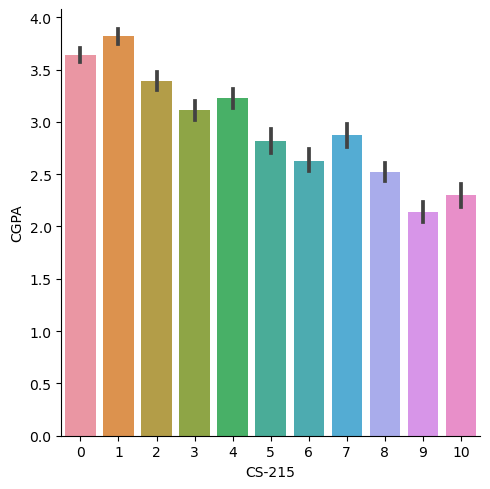

<Figure size 600x400 with 0 Axes>

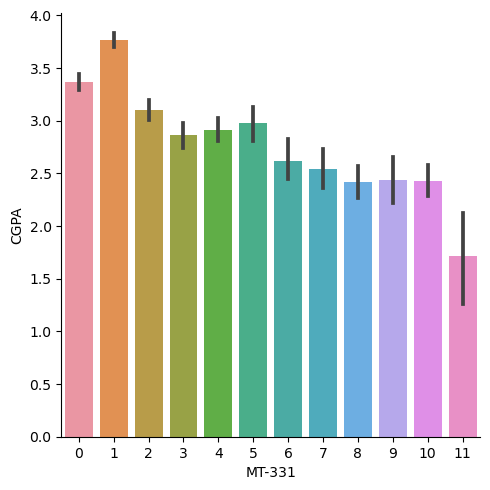

<Figure size 600x400 with 0 Axes>

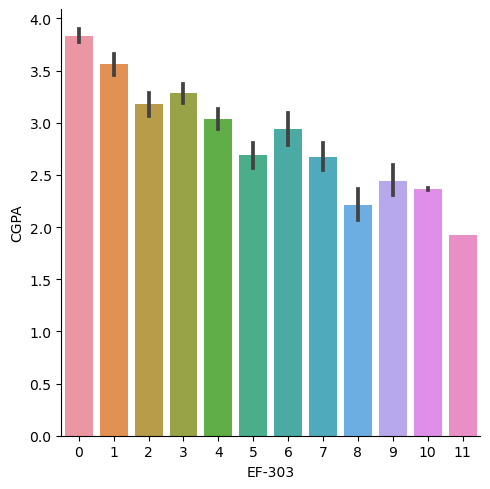

<Figure size 600x400 with 0 Axes>

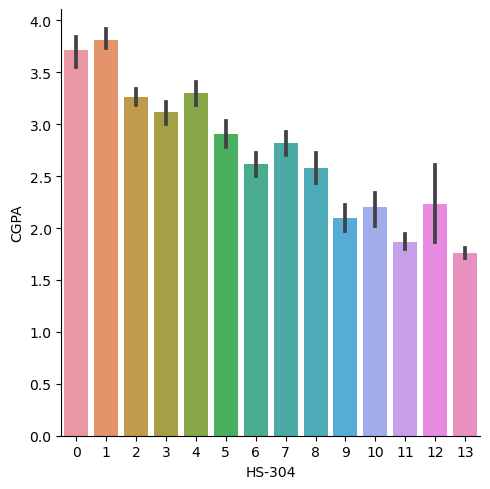

<Figure size 600x400 with 0 Axes>

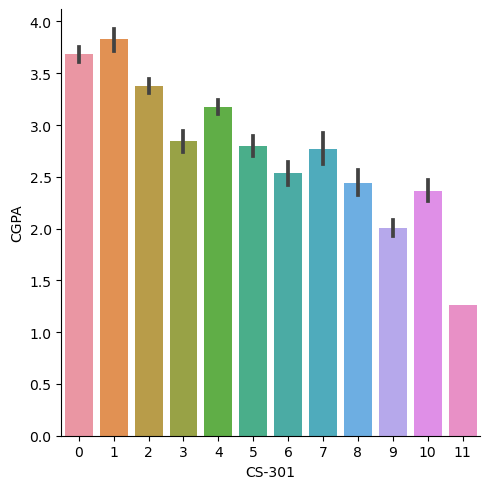

<Figure size 600x400 with 0 Axes>

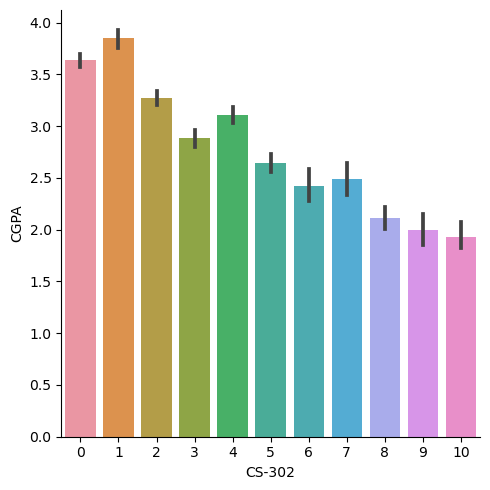

<Figure size 600x400 with 0 Axes>

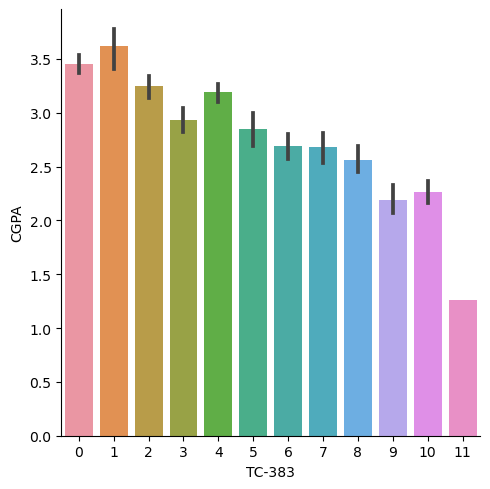

<Figure size 600x400 with 0 Axes>

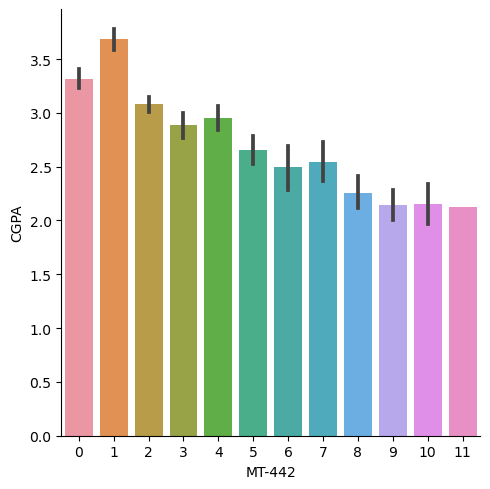

<Figure size 600x400 with 0 Axes>

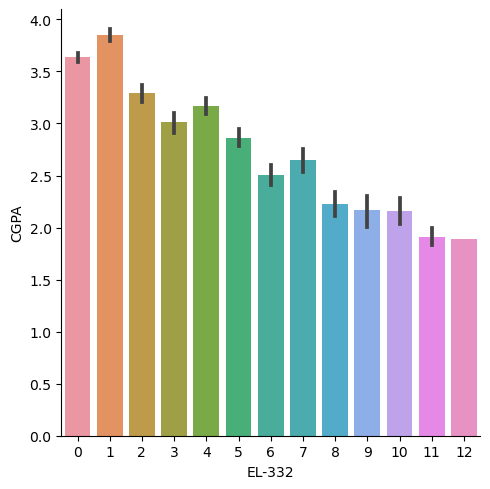

<Figure size 600x400 with 0 Axes>

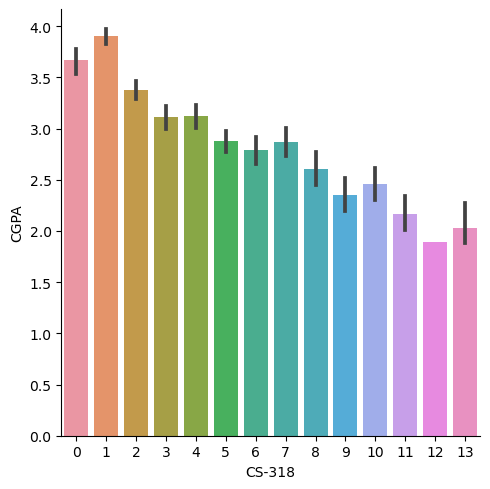

<Figure size 600x400 with 0 Axes>

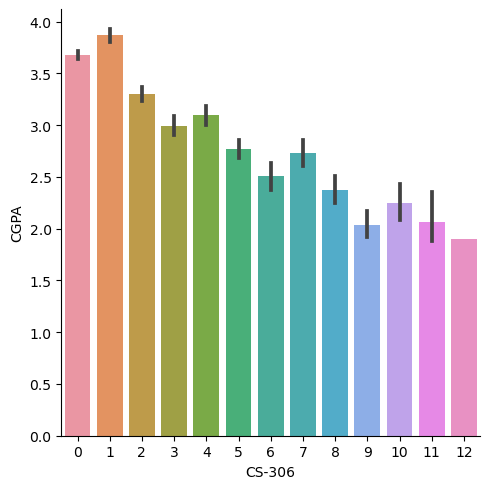

<Figure size 600x400 with 0 Axes>

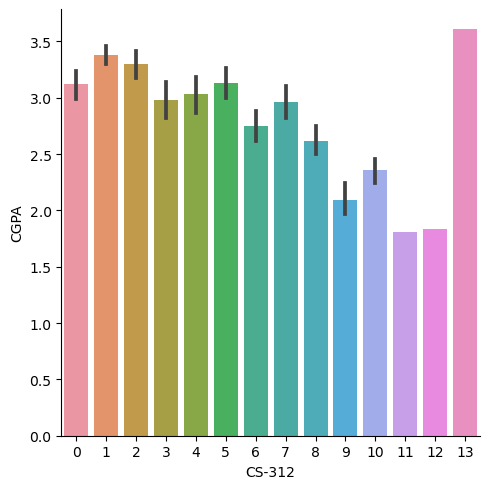

<Figure size 600x400 with 0 Axes>

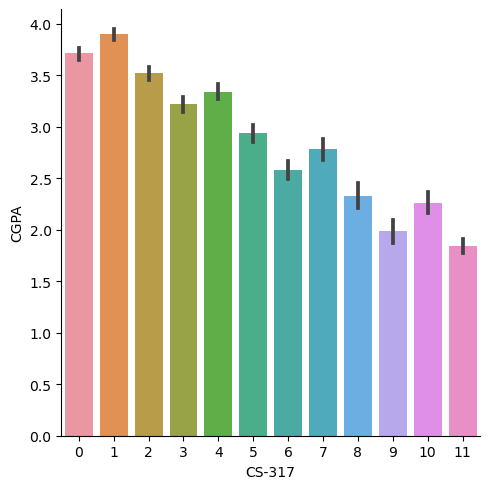

<Figure size 600x400 with 0 Axes>

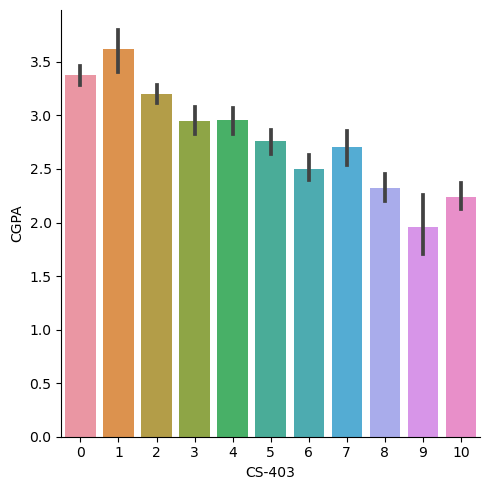

<Figure size 600x400 with 0 Axes>

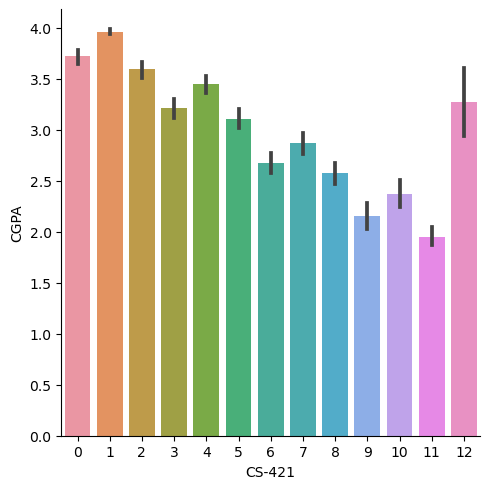

<Figure size 600x400 with 0 Axes>

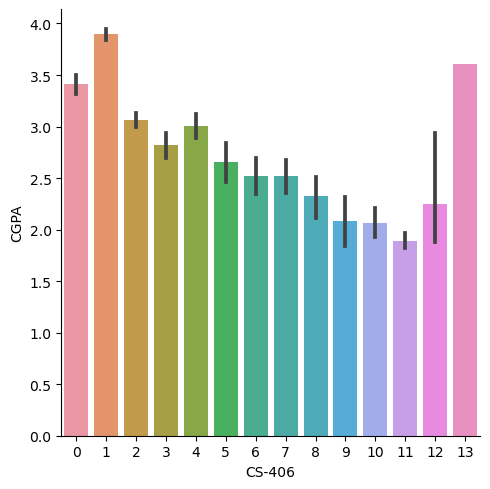

<Figure size 600x400 with 0 Axes>

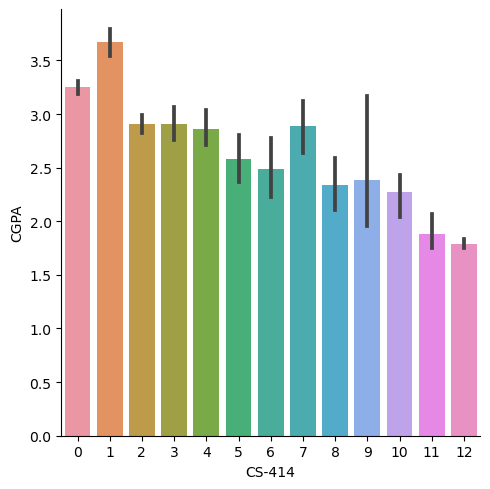

<Figure size 600x400 with 0 Axes>

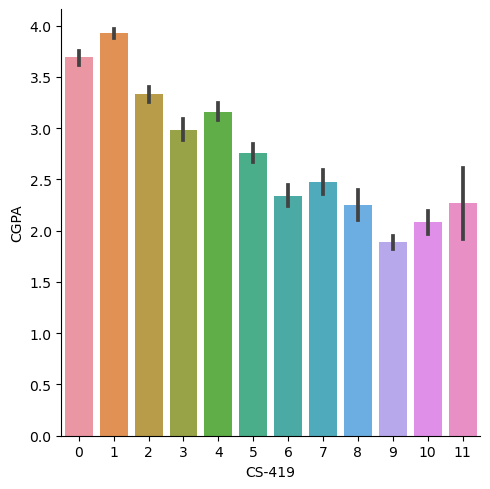

<Figure size 600x400 with 0 Axes>

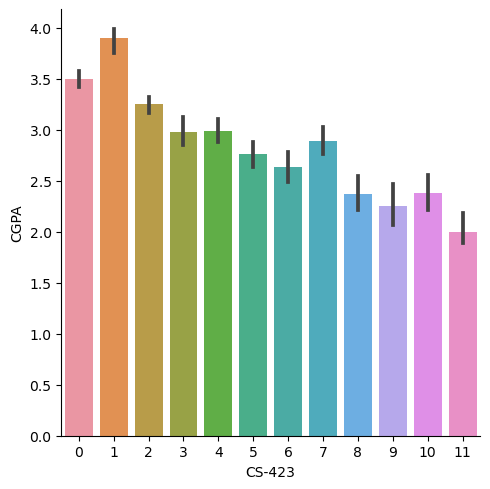

<Figure size 600x400 with 0 Axes>

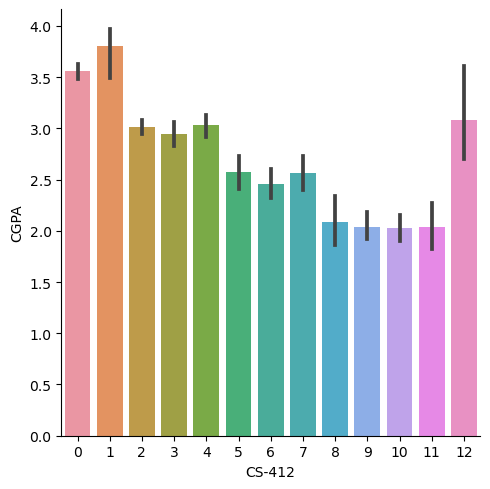

In [110]:
for col in df.drop(['CGPA'],axis=1):
    plt.figure(figsize=(6,4))
    sns.catplot(x=col,y='CGPA',data=df,kind='bar')
    plt.show()

We observe from the above plot that for getting high CGPA you have to get grade 0 and 1 if you get 0 and 1 grade in all subject it means your CGPA is high by getting grade 1 in all subject CGPA is considered very good.

Multivarient Analysis

In [111]:
sns.pairplot(df,palette="Dark2")
plt.show()

In [112]:
cor=df.corr()
cor

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
PH-121,1.000000,0.364662,0.542480,0.489461,0.457760,0.590384,0.278479,0.408450,0.580460,0.526575,...,0.065410,0.476340,0.368667,0.327924,0.301207,0.187699,0.503203,0.119664,0.316964,-0.642891
HS-101,0.364662,1.000000,0.318734,0.466245,0.429801,0.383307,0.307744,0.345745,0.303358,0.327945,...,0.228937,0.367613,0.250034,0.321463,0.275355,0.245779,0.301938,0.242951,0.236217,-0.525553
CY-105,0.542480,0.318734,1.000000,0.478800,0.519495,0.568184,0.349782,0.421849,0.484034,0.462803,...,0.298765,0.494913,0.525173,0.403245,0.151716,0.044900,0.484092,0.153844,0.085047,-0.647309
HS-105/12,0.489461,0.466245,0.478800,1.000000,0.475902,0.474835,0.485935,0.341497,0.409673,0.312481,...,0.283881,0.489800,0.486041,0.447928,0.181047,0.167917,0.496238,0.256895,0.166924,-0.614840
MT-111,0.457760,0.429801,0.519495,0.475902,1.000000,0.381212,0.491839,0.543150,0.403776,0.462213,...,0.509412,0.572161,0.455681,0.548722,0.318325,0.256619,0.536780,0.429186,0.287769,-0.744468
CS-105,0.590384,0.383307,0.568184,0.474835,0.381212,1.000000,0.276018,0.345009,0.498891,0.440830,...,0.083275,0.397862,0.319673,0.269655,0.256310,0.153554,0.339665,0.066309,0.198109,-0.583631
CS-106,0.278479,0.307744,0.349782,0.485935,0.491839,0.276018,1.000000,0.316386,0.286380,0.286875,...,0.489331,0.427427,0.470442,0.429159,0.141503,0.132402,0.452287,0.365533,0.200543,-0.541780
EL-102,0.408450,0.345745,0.421849,0.341497,0.543150,0.345009,0.316386,1.000000,0.454893,0.460814,...,0.338204,0.480480,0.348618,0.406521,0.272197,0.277301,0.414231,0.401338,0.286203,-0.652520
EE-119,0.580460,0.303358,0.484034,0.409673,0.403776,0.498891,0.286380,0.454893,1.000000,0.560468,...,0.176641,0.454772,0.372093,0.380161,0.309460,0.232167,0.488164,0.259521,0.333823,-0.650335
ME-107,0.526575,0.327945,0.462803,0.312481,0.462213,0.440830,0.286875,0.460814,0.560468,1.000000,...,0.216019,0.472185,0.362915,0.372211,0.315541,0.176587,0.467242,0.239895,0.309134,-0.661765


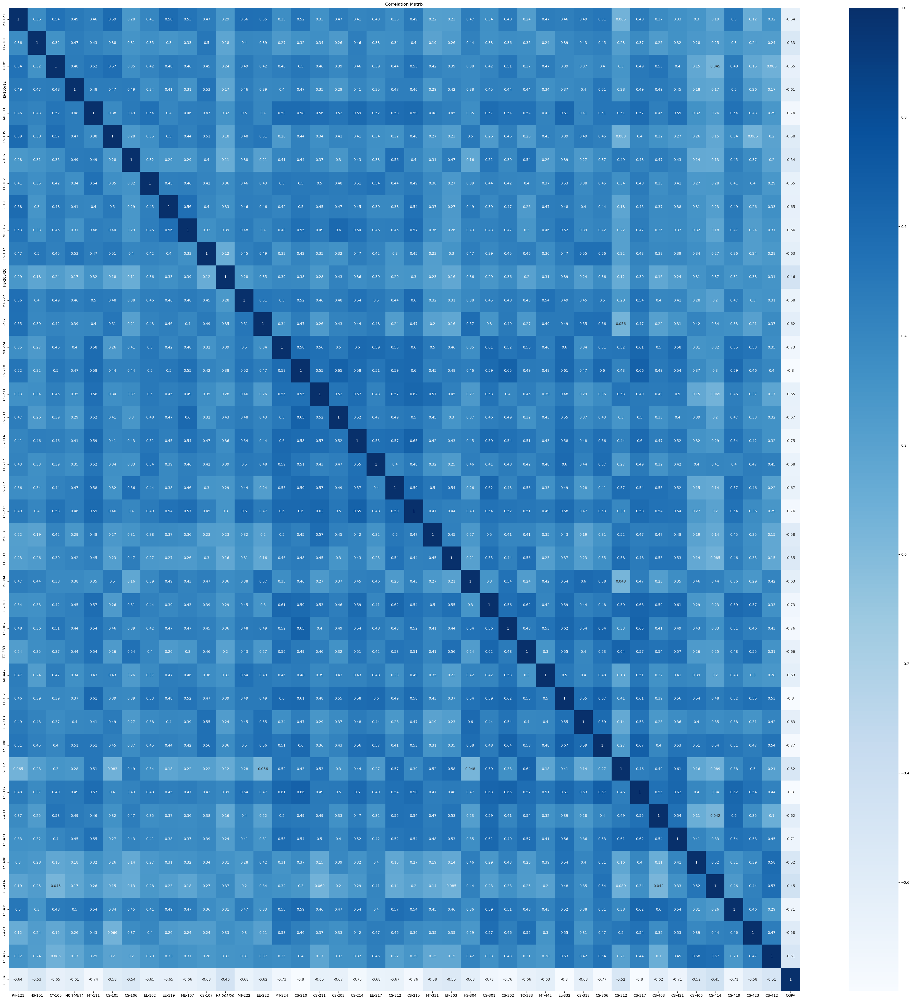

In [113]:
plt.figure(figsize= (50,50))
sns.heatmap(df.corr(), cmap = 'Blues', annot = True)
plt.title("Correlation Matrix")
plt.show()

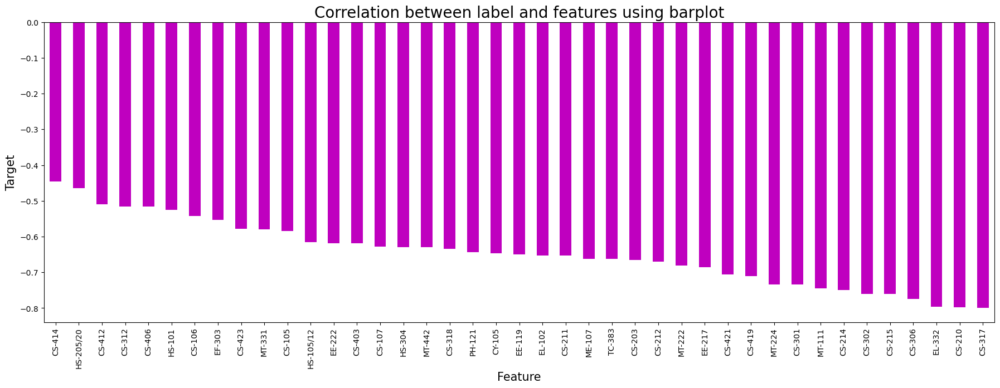

In [114]:
plt.figure(figsize=(22,7))
cor['CGPA'].sort_values(ascending=False).drop(['CGPA']).plot(kind="bar",color="m")
plt.xlabel("Feature",fontsize=15)
plt.ylabel("Target",fontsize=15)
plt.title("Correlation between label and features using barplot",fontsize=20)
plt.show()

We observe from the above matrix that all the columns are negatively correlated with our target variable,also majority of columns are correlated with each other because the target variable is our CGPA and CGPA is based on the subjects marks so they are all positively correlated with each other

In [115]:
from sklearn.preprocessing import LabelEncoder

In [116]:
LE=LabelEncoder()
for i in df:
    df[i]=LE.fit_transform(df[i])
df

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,5,10,8,6,8,10,9,8,5,8,...,8,8,8,8,2,0,8,3,2,66
1,0,9,10,9,5,6,9,0,10,9,...,10,9,6,9,2,5,6,6,3,42
2,0,3,0,5,4,0,5,4,2,2,...,3,3,0,6,0,0,0,2,0,400
3,9,7,10,9,9,2,10,8,9,7,...,10,6,10,8,5,3,7,7,7,27
4,2,2,2,4,0,0,2,4,0,2,...,5,4,4,5,2,0,2,2,0,356
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,3,0,0,2,1,0,2,2,1,4,...,2,2,0,0,0,4,4,3,0,450
567,1,0,0,0,0,0,0,2,0,0,...,4,4,0,0,2,3,2,6,2,448
568,3,0,2,4,0,0,0,0,0,3,...,2,3,0,4,0,6,4,2,2,360
569,0,4,9,0,9,10,5,8,5,8,...,9,3,3,8,9,6,3,5,6,64


In [117]:
df.describe()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
count,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,...,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000
mean,3.691622,5.028520,2.795009,4.176471,3.841355,2.766488,4.069519,3.884135,3.855615,4.723708,...,4.108734,4.832442,3.477718,5.427807,3.001783,2.440285,3.889483,4.001783,3.067736,242.811052
std,2.983182,2.777314,2.840846,3.148562,2.919418,2.639809,2.674045,2.960293,2.622466,3.102469,...,3.356861,2.764652,2.965869,2.734478,2.486750,2.500803,2.390886,2.807833,2.348794,136.789802
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,3.000000,0.000000,2.000000,2.000000,0.000000,2.000000,2.000000,2.000000,2.000000,...,1.000000,3.000000,1.000000,3.000000,2.000000,0.000000,2.000000,2.000000,2.000000,128.000000
50%,3.000000,5.000000,2.000000,4.000000,3.000000,2.000000,4.000000,3.000000,3.000000,4.000000,...,4.000000,5.000000,3.000000,5.000000,2.000000,2.000000,4.000000,4.000000,2.000000,242.000000
75%,6.000000,7.000000,4.000000,7.000000,6.000000,4.000000,5.000000,6.000000,6.000000,7.000000,...,7.000000,7.000000,5.000000,7.000000,4.000000,4.000000,5.000000,6.000000,4.000000,359.000000
max,10.000000,10.000000,10.000000,10.000000,11.000000,10.000000,10.000000,10.000000,10.000000,10.000000,...,13.000000,11.000000,10.000000,12.000000,13.000000,12.000000,11.000000,11.000000,12.000000,481.000000


1.No need to check for outliers because our feature data is in object type so no need to remove them 2.No need to check for skewness in features because our feature data is in object type so no need to remove skewness 3.No need to check for multicollinearity for independent variables as data is object type so no need to check for multicollinearity

In [118]:
x=df.drop(['CGPA'],axis=1)
y=df['CGPA']

In [119]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)
x

array([[ 0.43897606,  1.79162927,  1.83383298, ...,  1.72077861,
        -0.35709981, -0.45499486],
       [-1.23858231,  1.43124776,  2.53847703, ...,  0.88352206,
         0.71229339, -0.02886445],
       [-1.23858231, -0.73104127, -0.98474319, ..., -1.62824758,
        -0.71356421, -1.30725569],
       ...,
       [-0.23204729, -1.81218579, -0.28009915, ...,  0.04626551,
        -0.71356421, -0.45499486],
       [-1.23858231, -0.37065977,  2.18615501, ..., -0.37236276,
         0.35582899,  1.24952679],
       [ 0.77448773,  1.43124776,  2.18615501, ...,  0.04626551,
         1.78168659,  2.10178761]])

In [120]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor,AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV 
from sklearn.metrics import roc_auc_score,roc_curve,accuracy_score

In [146]:
maxAccu=0
maxRS=0
for i in range (1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=i)
    LR=LinearRegression()
    LR.fit(x_train,y_train)
    pred=LR.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best Accuracy is ",maxAccu,"on Random_state ",maxRS)

Best Accuracy is  0.987917970340511 on Random_state  168


In [147]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30, random_state=maxRS)

In [148]:
LR=LinearRegression()
LR.fit(x_train,y_train)
pred1=LR.predict(x_test)
pred2=LR.predict(x_train)
print('R2_score for test data: ',r2_score(y_test,pred1))
print('R2_score on training data: ',r2_score(y_train,pred2)*100)
print('Mean Absolute Error: ',mean_absolute_error(y_test,pred1))
print('Mean Squared Error: ',mean_squared_error(y_test,pred1))
print('Root Mean Squared Error: ',np.sqrt(mean_squared_error(y_test,pred1)))

R2_score for test data:  0.987917970340511
R2_score on training data:  98.5467410164778
Mean Absolute Error:  12.397722488891105
Mean Squared Error:  237.94163841648748
Root Mean Squared Error:  15.425356994782568


In [149]:
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)
pred3=RFR.predict(x_test)
pred4=RFR.predict(x_train)
print('R2_score for test data: ',r2_score(y_test,pred3))
print('R2_score on training data: ',r2_score(y_train,pred4)*100)
print('Mean Absolute Error: ',mean_absolute_error(y_test,pred3))
print('Mean Squared Error: ',mean_squared_error(y_test,pred3))
print('Root Mean Squared Error: ',np.sqrt(mean_squared_error(y_test,pred3)))

R2_score for test data:  0.9629226614004647
R2_score on training data:  99.32431354736596
Mean Absolute Error:  20.651715976331364
Mean Squared Error:  730.1954177514793
Root Mean Squared Error:  27.02212829796127


In [150]:
knn=KNeighborsRegressor()
knn.fit(x_train,y_train)
pred5=knn.predict(x_test)
pred6=knn.predict(x_train)
print('R2_score for test data: ',r2_score(y_test,pred5))
print('R2_score on training data: ',r2_score(y_train,pred6)*100)
print('Mean Absolute Error: ',mean_absolute_error(y_test,pred5))
print('Mean Squared Error: ',mean_squared_error(y_test,pred5))
print('Root Mean Squared Error: ',np.sqrt(mean_squared_error(y_test,pred5)))

R2_score for test data:  0.9717522915895256
R2_score on training data:  97.5745228889034
Mean Absolute Error:  18.368047337278107
Mean Squared Error:  556.3060355029586
Root Mean Squared Error:  23.586140750511913


In [151]:
DTR=DecisionTreeRegressor()
DTR.fit(x_train,y_train)
pred7=DTR.predict(x_test)
pred8=DTR.predict(x_train)
print('R2_score for test data: ',r2_score(y_test,pred7))
print('R2_score on training data: ',r2_score(y_train,pred8)*100)
print('Mean Absolute Error: ',mean_absolute_error(y_test,pred7))
print('Mean Squared Error: ',mean_squared_error(y_test,pred7))
print('Root Mean Squared Error: ',np.sqrt(mean_squared_error(y_test,pred7)))

R2_score for test data:  0.8634637948041555
R2_score on training data:  100.0
Mean Absolute Error:  40.5207100591716
Mean Squared Error:  2688.923076923077
Root Mean Squared Error:  51.85482693947669


In [152]:
GBR=GradientBoostingRegressor()
GBR.fit(x_train,y_train)
pred_2=GBR.predict(x_test)
pred_3=GBR.predict(x_train)
print('R2_score for test data: ',r2_score(y_test,pred_2))
print('R2_score on training data: ',r2_score(y_train,pred_3)*100)
print('Mean Absolute Error: ',mean_absolute_error(y_test,pred_2))
print('Mean Squared Error: ',mean_squared_error(y_test,pred_2))
print('Root Mean Squared Error: ',np.sqrt(mean_squared_error(y_test,pred_2)))

R2_score for test data:  0.9773484226573618
R2_score on training data:  99.7443205226798
Mean Absolute Error:  16.03802303562302
Mean Squared Error:  446.0966888450014
Root Mean Squared Error:  21.1210011326405


In [153]:
ADA=AdaBoostRegressor()
ADA.fit(x_train,y_train)
pred_4=ADA.predict(x_test)
pred_5=GBR.predict(x_train)
print('R2_score for test data: ',r2_score(y_test,pred_4))
print('R2_score on training data: ',r2_score(y_train,pred_5)*100)
print('Mean Absolute Error: ',mean_absolute_error(y_test,pred_4))
print('Mean Squared Error: ',mean_squared_error(y_test,pred_4))
print('Root Mean Squared Error: ',np.sqrt(mean_squared_error(y_test,pred_4)))

R2_score for test data:  0.9366374844031948
R2_score on training data:  99.7443205226798
Mean Absolute Error:  29.61315064784448
Mean Squared Error:  1247.8516607061315
Root Mean Squared Error:  35.324943888223395


In [154]:
score=cross_val_score(LR,x,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is: ",(r2_score(y_test,pred1)-score.mean())*100)

[0.98501003 0.98636443 0.98359237 0.97911011 0.97921942]
0.9826592722413672
Difference between R2 score and cross validation score is:  0.525869809914381


In [155]:
score1=cross_val_score(RFR,x,y)
print(score1)
print(score1.mean())
print("Difference between R2 score and cross validation score is: ",(r2_score(y_test,pred3)-score1.mean())*100)

[0.95978542 0.96147498 0.95738111 0.94920125 0.94361918]
0.9542923856259676
Difference between R2 score and cross validation score is:  0.8630275774497043


In [156]:
score2=cross_val_score(knn,x,y)
print(score2)
print(score2.mean())
print("Difference between R2 score and cross validation score is: ",(r2_score(y_test,pred5)-score2.mean())*100)

[0.97603374 0.95739669 0.96792602 0.96634618 0.94256663]
0.9620538531835994
Difference between R2 score and cross validation score is:  0.9698438405926213


In [157]:
score3=cross_val_score(DTR,x,y)
print(score3)
print(score3.mean())
print("Difference between R2 score and cross validation score is: ",(r2_score(y_test,pred7)-score3.mean())*100)

[0.86422842 0.79112391 0.79724518 0.80029282 0.81535034]
0.8136481344544597
Difference between R2 score and cross validation score is:  4.981566034969576


In [159]:
score4=cross_val_score(GBR,x,y)
print(score4)
print(score4.mean())
print("Difference between R2 score and cross validation score is: ",(r2_score(y_test,pred_2)-score4.mean())*100)

[0.96696011 0.97055163 0.96264232 0.97089184 0.9694972 ]
0.968108619618835
Difference between R2 score and cross validation score is:  0.9239803038526784


In [160]:
score4=cross_val_score(ADA,x,y)
print(score4)
print(score4.mean())
print("Difference between R2 score and cross validation score is: ",(r2_score(y_test,pred_4)-score4.mean())*100)

[0.92887869 0.92316847 0.92052709 0.93886977 0.90900306]
0.9240894172032389
Difference between R2 score and cross validation score is:  1.2548067199955937


In [136]:
score5=cross_val_score(ADA,x,y)
print(score5)
print(score5.mean())
print("Difference between R2 score and cross validation score is: ",(r2_score(y_test,pred_4)-score5.mean())*100)

[0.92984848 0.93325998 0.92714551 0.92749895 0.91401826]
0.9263542366668875
Difference between R2 score and cross validation score is:  0.7011655779034398


We choose Linear Regression as the best working Model

In [164]:
grid_param={'fit_intercept':[True,False],
    'copy_X' : [True,False],
    'positive' :[True,False]    
           }

In [165]:
GSCV=GridSearchCV(LinearRegression(),grid_param,cv=3)

In [166]:
GSCV.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=LinearRegression(),
             param_grid={'copy_X': [True, False],
                         'fit_intercept': [True, False],
                         'positive': [True, False]})

In [167]:
GSCV.best_params_

{'copy_X': True, 'fit_intercept': True, 'positive': False}

In [169]:
Model=LinearRegression(copy_X=True, fit_intercept=True, positive=False)
Model.fit(x_train,y_train)
pred=Model.predict(x_test)
Regressor = Model.fit(x_train, y_train)
mod_pred = Model.predict(x_test)
mod_acc = (r2_score(y_test, mod_pred))*100
print("R2 score for the Best Model is:", mod_acc)

R2 score for the Best Model is: 98.7917970340511


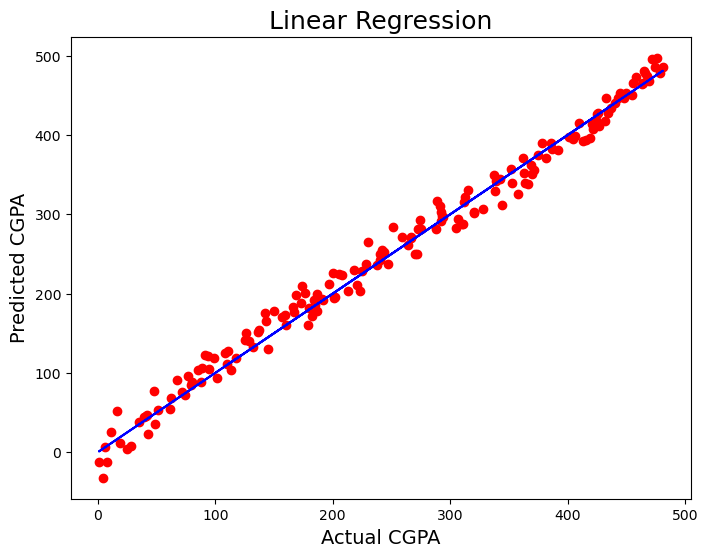

In [170]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred1,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual CGPA',fontsize=14)
plt.ylabel('Predicted CGPA',fontsize=14)
plt.title('Linear Regression',fontsize=18)
plt.savefig('LR.png')
plt.show()

In [171]:
import joblib
joblib.dump(Model,"Students Grade.pkl")

['Students Grade.pkl']